In [1]:
# importation des packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [2]:
df= pd.read_csv("/kaggle/input/house-prices-advanced-regression-techniques/train.csv")

In [3]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


# I-Visualisation et Analyse des Données 

### signification des variables
    Id : Identifiant unique de chaque propriété.
    MSSubClass : Catégorie de type de résidence (par exemple, maison individuelle, maison en bande, etc.).
    MSZoning : Classification de la zone de la propriété (résidentielle, commerciale, etc.).
    LotFrontage : Longueur de la façade du lot en pieds.
    LotArea : Taille du terrain en pieds carrés.
    Street : Type de rue (gravier ou pavée).
    Alley : Type d'allée d'accès (gravier, pavée, ou sans allée).
    LotShape : Forme générale du lot (régulière, irrégulière, etc.).
    LandContour : Niveau du terrain par rapport aux propriétés environnantes.
    Utilities : Type de services disponibles (électricité, gaz, eau, etc.).
    LotConfig : Configuration du lot (en angle, intérieur, etc.).
    LandSlope : Pente du terrain.
    Neighborhood : Quartier de la maison dans la ville.
    Condition1 & Condition2 : Proximité d'une route principale ou d'une voie ferrée.
    BldgType : Type de bâtiment (maison individuelle, jumelée, etc.).
    HouseStyle : Style architectural (niveau unique, avec étage, etc.).
    OverallQual : Qualité globale des matériaux et de la finition (score de 1 à 10).
    OverallCond : Condition générale de la maison (score de 1 à 10).
    YearBuilt : Année de construction de la maison.
    YearRemodAdd : Année de la dernière rénovation.
    RoofStyle : Style de toit (en pente, plat, etc.).
    RoofMatl : Matériau du toit.
    Exterior1st & Exterior2nd : Matériaux de revêtement extérieur (principal et secondaire).
    MasVnrType : Type de parement en maçonnerie.
    MasVnrArea : Surface du parement en maçonnerie.
    ExterQual : Qualité des matériaux extérieurs (Excellente, Bonne, etc.).
    ExterCond : Condition des matériaux extérieurs.
    Foundation : Type de fondation (béton, briques, etc.).
    BsmtQual : Hauteur du sous-sol.
    BsmtCond : État général du sous-sol.
    BsmtExposure : Exposition du sous-sol (fenêtres).
    BsmtFinType1 & BsmtFinType2 : Type d'aménagement du sous-sol (partiel, total, non aménagé).
    BsmtFinSF1 & BsmtFinSF2 : Surface aménagée du sous-sol (en pieds carrés).
    BsmtUnfSF : Surface non aménagée du sous-sol.
    TotalBsmtSF : Surface totale du sous-sol.
    Heating : Type de chauffage.
    HeatingQC : Qualité et état du système de chauffage.
    CentralAir : Présence de climatisation centrale.
    Electrical : Type de système électrique.
    1stFlrSF & 2ndFlrSF : Surface en pieds carrés du premier et du deuxième étage.
    LowQualFinSF : Surface aménagée de basse qualité.
    GrLivArea : Surface habitable au-dessus du niveau du sol (en pieds carrés).
    BsmtFullBath & BsmtHalfBath : Nombre de salles de bain complètes et demi dans le sous-sol.
    FullBath & HalfBath : Nombre de salles de bain complètes et demi dans la maison au-dessus du sous-sol.
    BedroomAbvGr : Nombre de chambres à coucher au-dessus du sous-sol.
    KitchenAbvGr : Nombre de cuisines au-dessus du sous-sol.
    KitchenQual : Qualité de la cuisine.
    TotRmsAbvGrd : Nombre total de pièces (salles de bain non incluses).
    Functional : Fonctionnalité de la maison (Typique, Légèrement altérée, etc.).
    Fireplaces : Nombre de cheminées.
    FireplaceQu : Qualité de la cheminée.
    GarageType : Type de garage (attenant, détaché, etc.).
    GarageYrBlt : Année de construction du garage.
    GarageFinish : Finition intérieure du garage.
    GarageCars : Capacité du garage en nombre de voitures.
    GarageArea : Surface du garage en pieds carrés.
    GarageQual & GarageCond : Qualité et état du garage.
    PavedDrive : Type d'allée (pavée ou non).
    WoodDeckSF : Surface de la terrasse en bois.
    OpenPorchSF : Surface du porche ouvert.
    EnclosedPorch : Surface du porche fermé.
    3SsnPorch : Surface du porche pour trois saisons.
    ScreenPorch : Surface du porche avec moustiquaire.
    PoolArea : Surface de la piscine.
    PoolQC : Qualité de la piscine.
    Fence : Qualité de la clôture.
    MiscFeature : Autres caractéristiques (ex: ascenseur, serre).
    MiscVal : Valeur des autres caractéristiques.
    MoSold : Mois de la vente.
    YrSold : Année de la vente.
    SaleType : Type de vente (négocié, normal, succession, etc.).
    SaleCondition : Condition de la vente (normale, nécessité de vente rapide, etc.).
    SalePrice : Prix de vente de la maison (cible pour les modèles prédictifs).
 

### Objectifs: predire le prix des appartements

# 0-Analyse des valeurs manquantes

<Axes: >

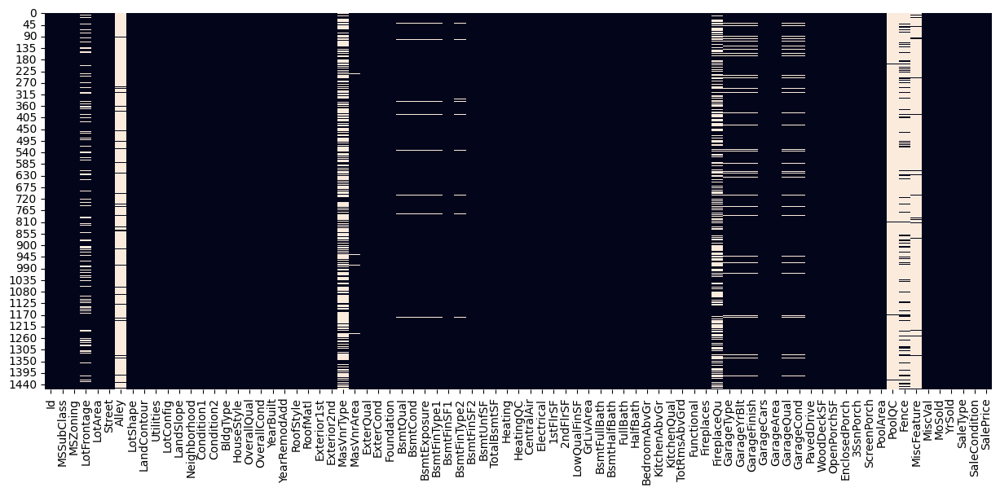

In [4]:
plt.figure(figsize=(15, 6))
sns.heatmap(df.isna(),cbar=False)

In [5]:
(df.isna().sum()/df.shape[0]).sort_values(ascending=False)

PoolQC         0.995205
MiscFeature    0.963014
Alley          0.937671
Fence          0.807534
MasVnrType     0.597260
                 ...   
BsmtUnfSF      0.000000
TotalBsmtSF    0.000000
Heating        0.000000
Id             0.000000
ExterCond      0.000000
Length: 81, dtype: float64

### Observations:
-certains variables ont enormement de valeurs manquantes : suppression de la variables
-d'autres en ont quelques une mais pas beaucoup: suppression des observations/ imputation

<Axes: >

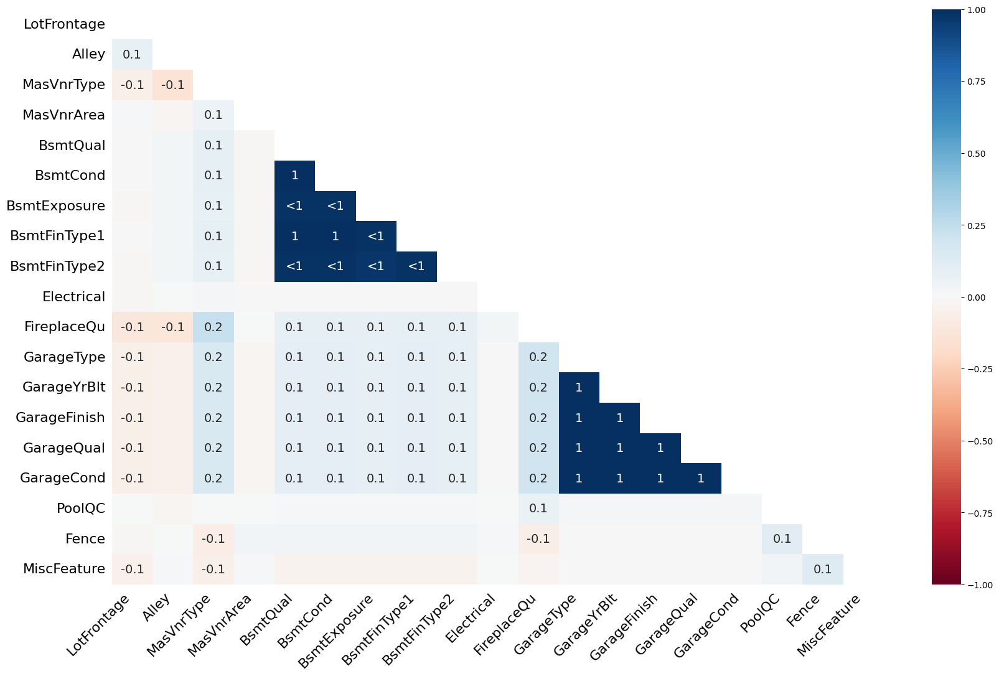

In [6]:
# Nature des valeurs manquantes
# correlation entre les valeurs manquantes
import missingno as mso
mso.heatmap(df)

### Observations:
les valeurs manquantes des variables 'MiscFeauture' ,'Fence' ,'PoolQC' ,'LotFrontage','Alley' ,'MasVnrType','MasVnrArea' sont MNAR le reste des valeurs manquantes est MAR

In [7]:
NAn_columns=df.columns[(df.isna().sum()/df.shape[0])>0.3]

In [8]:
NAn_columns

Index(['Alley', 'MasVnrType', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'], dtype='object')

### Execution: 

In [9]:
#suppression des variables indesirables
df=df.drop(columns=NAn_columns)

In [10]:
#suppression des observation manquates
df=df.dropna()

# 1-Analyse univariees

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1094 entries, 0 to 1459
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1094 non-null   int64  
 1   MSSubClass     1094 non-null   int64  
 2   MSZoning       1094 non-null   object 
 3   LotFrontage    1094 non-null   float64
 4   LotArea        1094 non-null   int64  
 5   Street         1094 non-null   object 
 6   LotShape       1094 non-null   object 
 7   LandContour    1094 non-null   object 
 8   Utilities      1094 non-null   object 
 9   LotConfig      1094 non-null   object 
 10  LandSlope      1094 non-null   object 
 11  Neighborhood   1094 non-null   object 
 12  Condition1     1094 non-null   object 
 13  Condition2     1094 non-null   object 
 14  BldgType       1094 non-null   object 
 15  HouseStyle     1094 non-null   object 
 16  OverallQual    1094 non-null   int64  
 17  OverallCond    1094 non-null   int64  
 18  YearBuilt    

In [12]:
# description du dataset
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000,...,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000,1094.000000
mean,727.375686,56.128885,70.759598,10132.346435,6.247715,5.575868,1972.412249,1985.915905,109.855576,448.191956,...,94.341865,46.946984,22.053016,3.266910,16.498172,3.007313,23.550274,6.335466,2007.786106,187033.263254
std,420.955488,41.976345,24.508859,8212.249621,1.366797,1.066500,31.189752,20.930772,190.667459,468.728095,...,122.624615,64.820019,61.570502,29.655973,58.455303,40.713175,167.135237,2.694558,1.334307,83165.332151
min,1.000000,20.000000,21.000000,1300.000000,2.000000,2.000000,1880.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,35311.000000
25%,366.500000,20.000000,60.000000,7606.750000,5.000000,5.000000,1953.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,132500.000000
50%,723.500000,50.000000,70.000000,9444.500000,6.000000,5.000000,1975.000000,1995.000000,0.000000,384.500000,...,0.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,165750.000000
75%,1093.750000,70.000000,80.000000,11387.250000,7.000000,6.000000,2003.000000,2005.000000,171.750000,712.750000,...,169.750000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,221000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,648.000000,2500.000000,12.000000,2010.000000,755000.000000


In [13]:
# separation des variables
variables_cathegorielles=df.select_dtypes("object")
variables_numeriques=df.select_dtypes(["float64","int64"])

In [14]:
variables_cathegorielles

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1456,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,...,SBrkr,TA,Min1,Attchd,Unf,TA,TA,Y,WD,Normal
1457,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1458,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,...,FuseA,Gd,Typ,Attchd,Unf,TA,TA,Y,WD,Normal


In [15]:
variables_numeriques

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,...,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,...,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,...,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,...,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,...,192,84,0,0,0,0,0,12,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,62.0,7917,6,5,1999,2000,0.0,0,...,0,40,0,0,0,0,0,8,2007,175000
1456,1457,20,85.0,13175,6,6,1978,1988,119.0,790,...,349,0,0,0,0,0,0,2,2010,210000
1457,1458,70,66.0,9042,7,9,1941,2006,0.0,275,...,0,60,0,0,0,0,2500,5,2010,266500
1458,1459,20,68.0,9717,5,6,1950,1996,0.0,49,...,366,0,112,0,0,0,0,4,2010,142125


### distribution des variables 

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


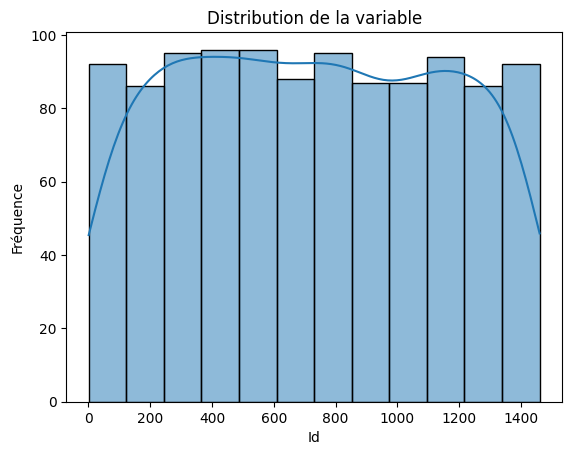

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


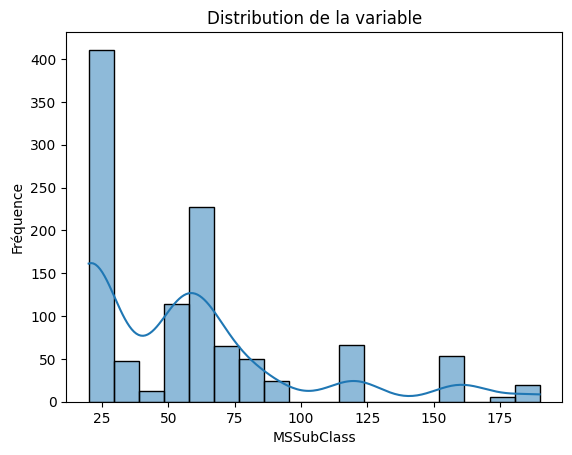

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


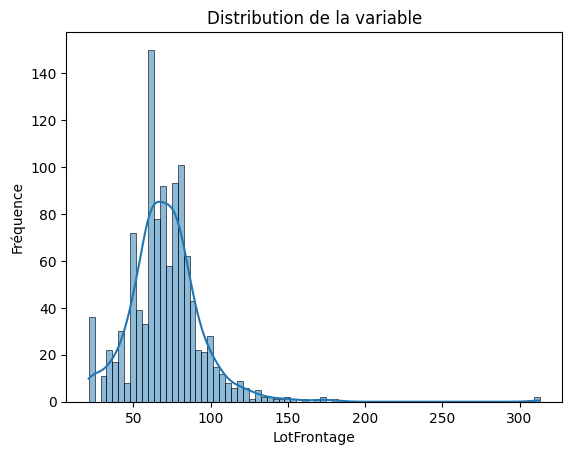

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


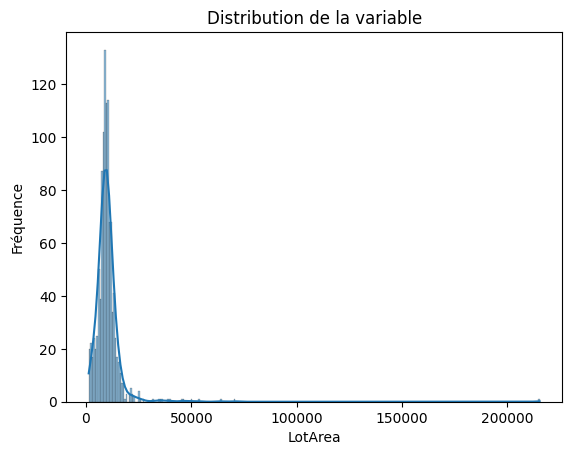

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


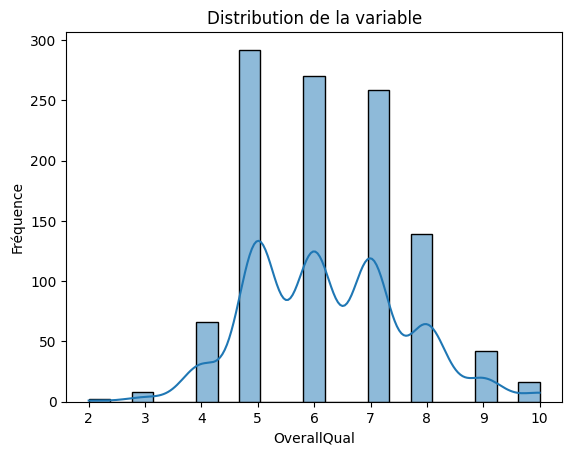

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


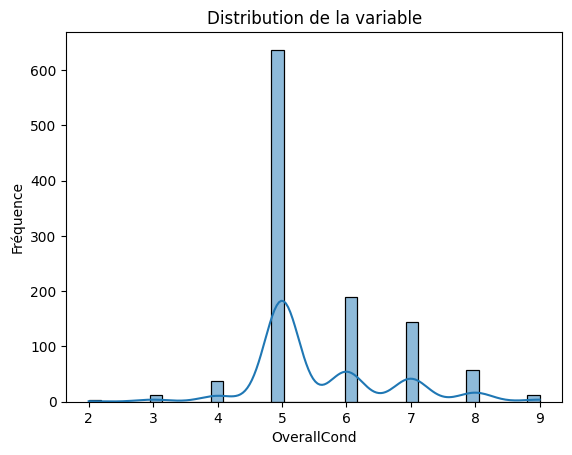

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


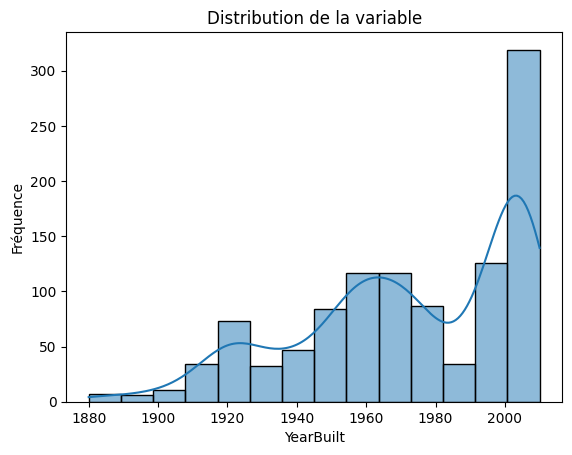

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


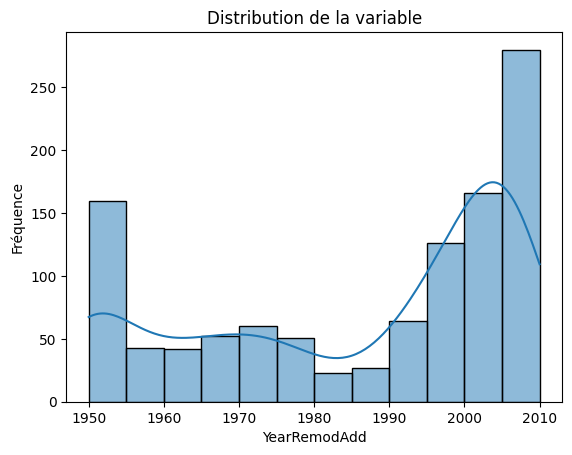

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


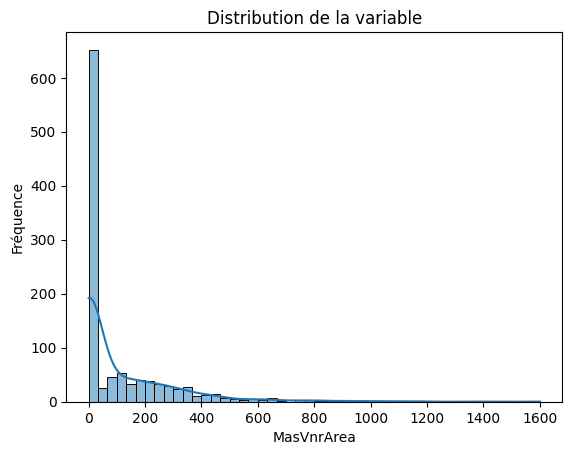

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


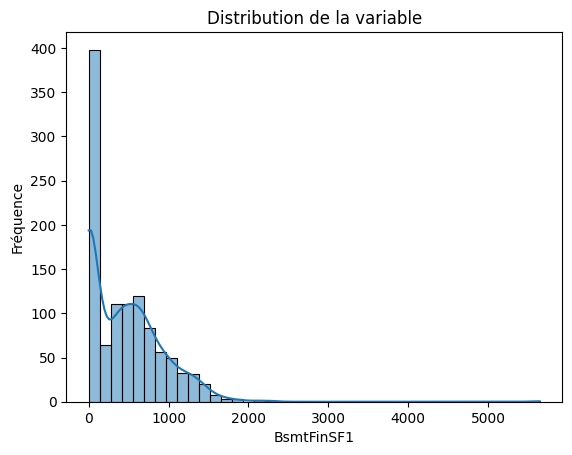

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


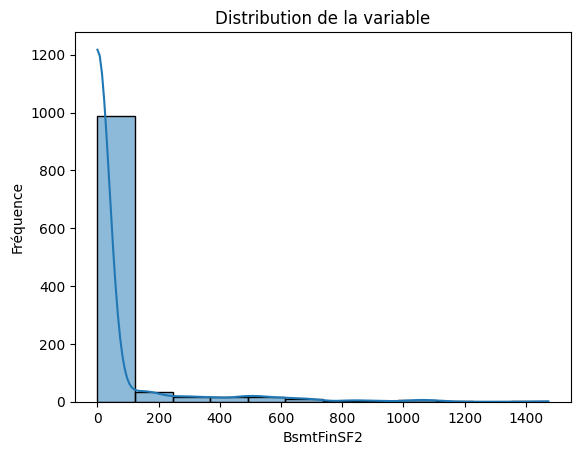

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


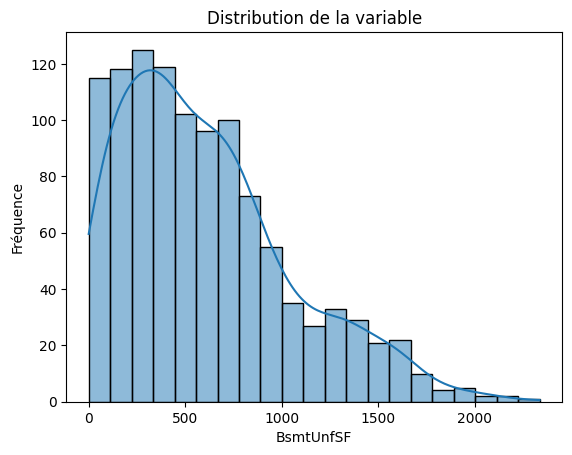

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


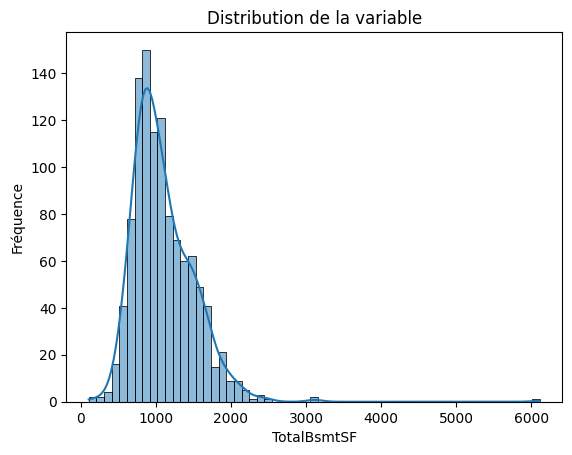

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


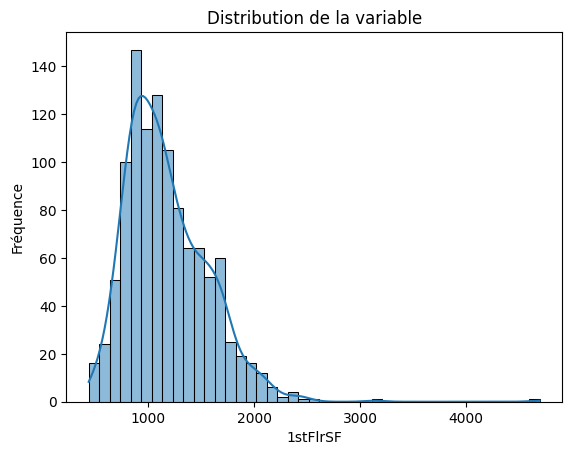

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


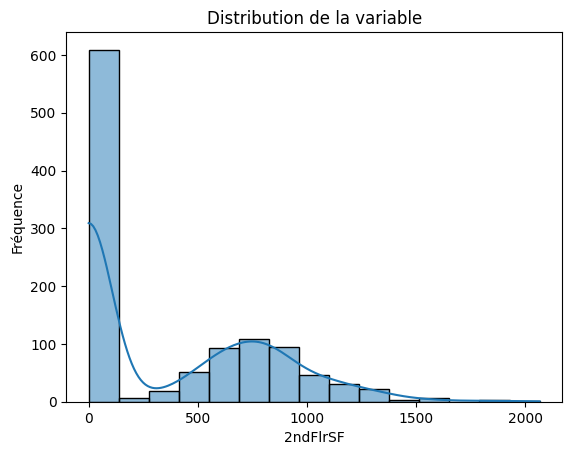

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


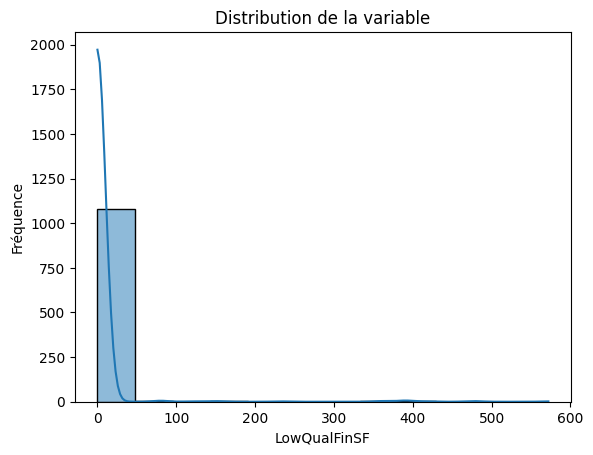

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


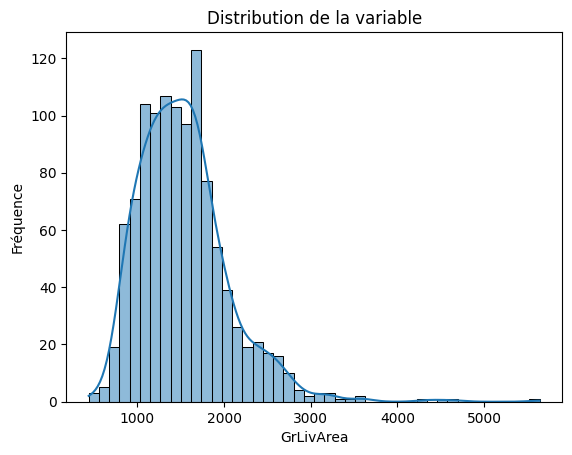

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


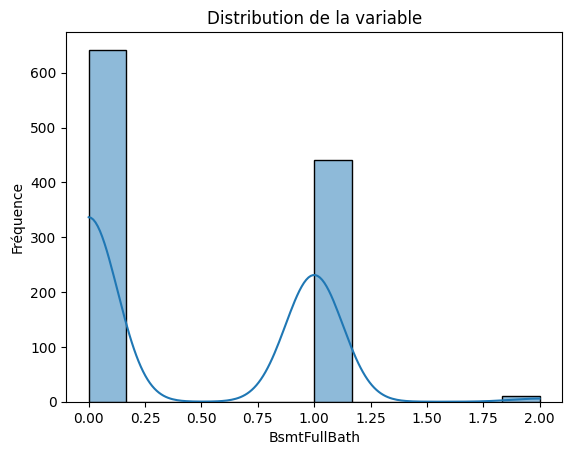

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


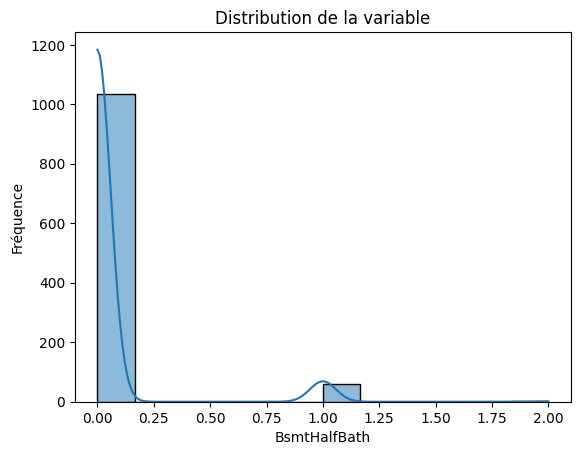

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


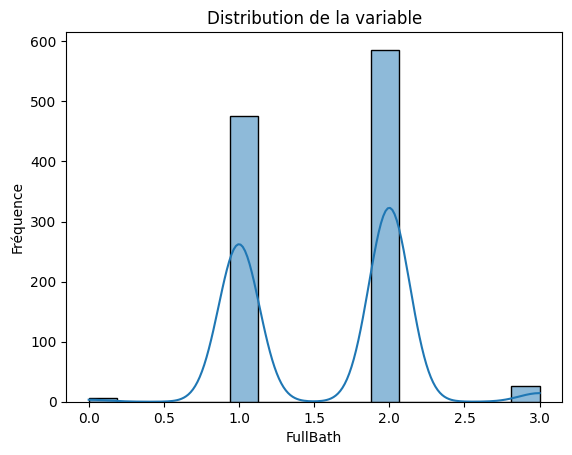

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


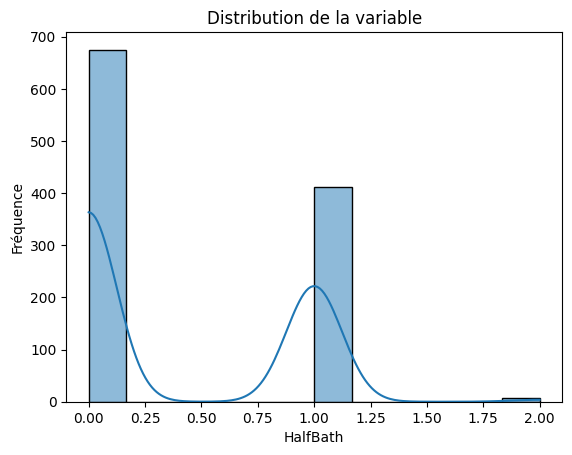

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


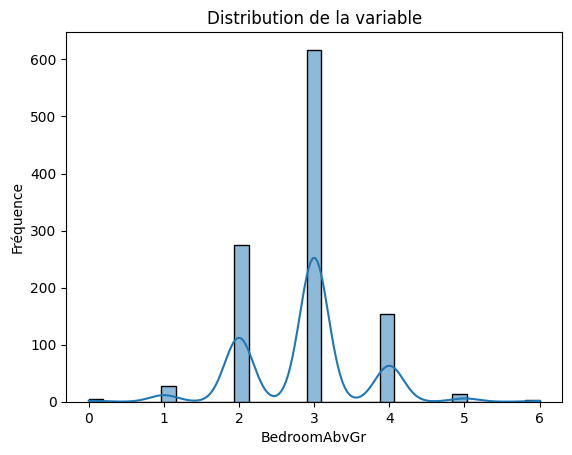

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


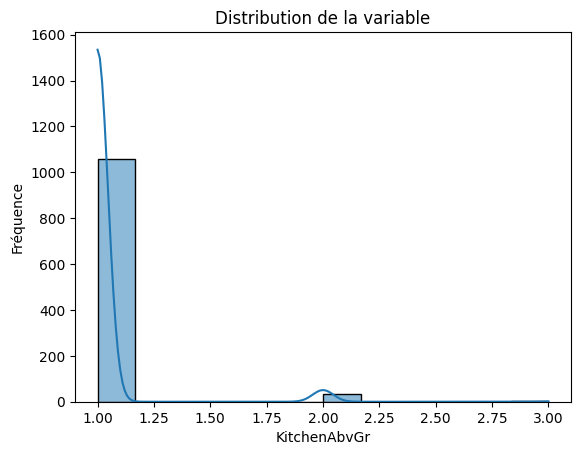

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


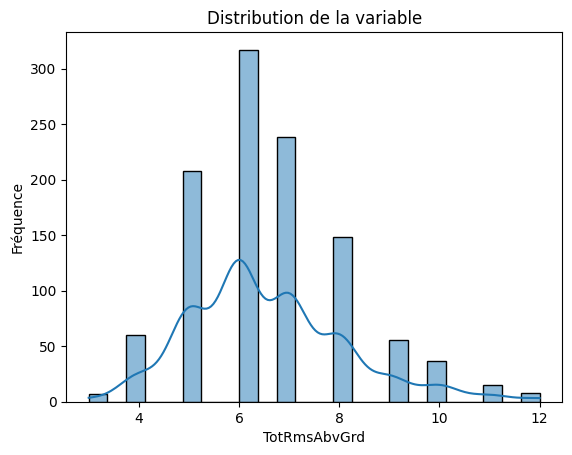

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


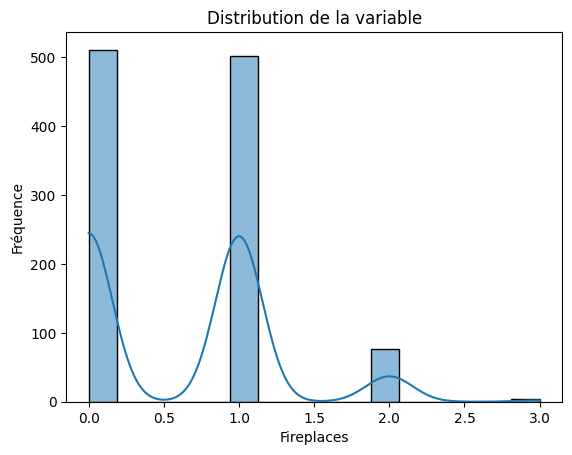

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


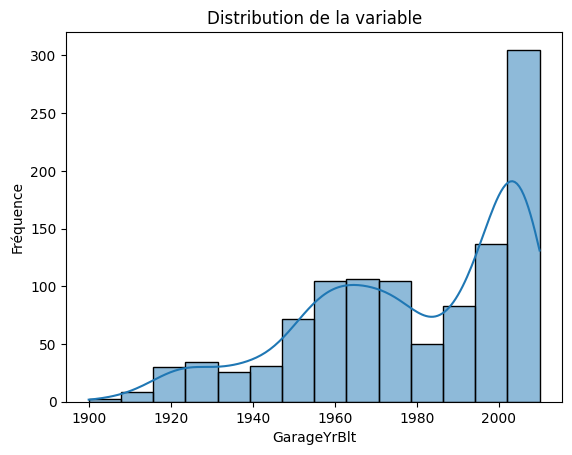

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


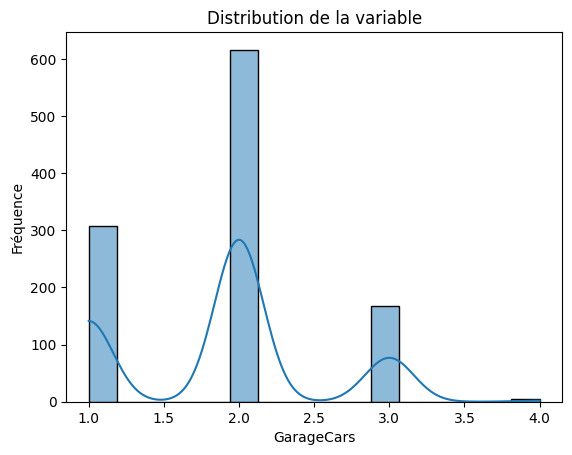

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


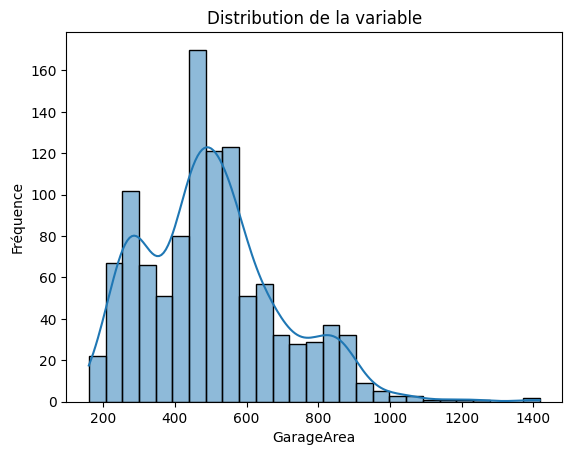

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


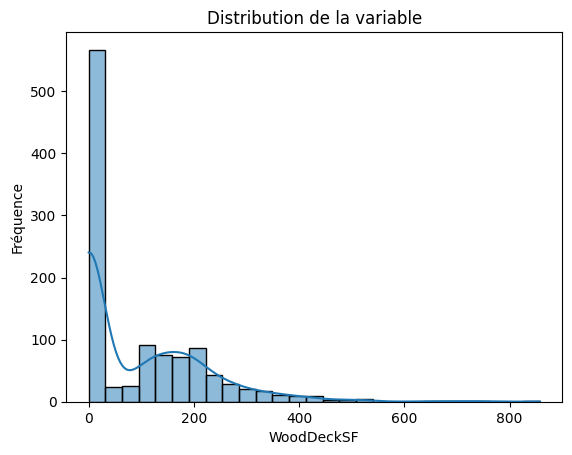

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


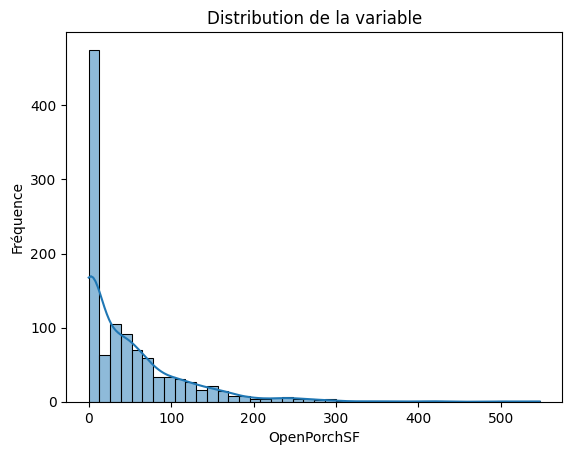

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


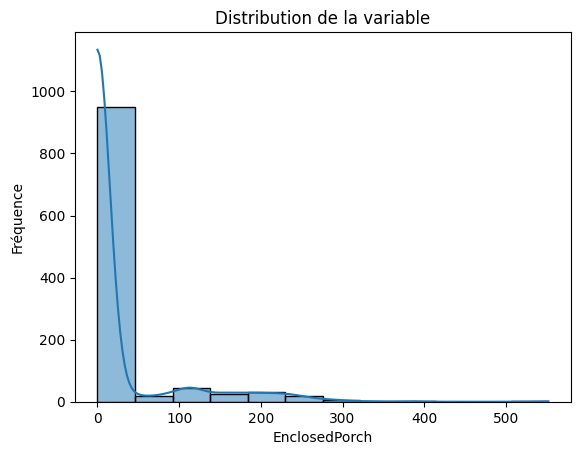

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


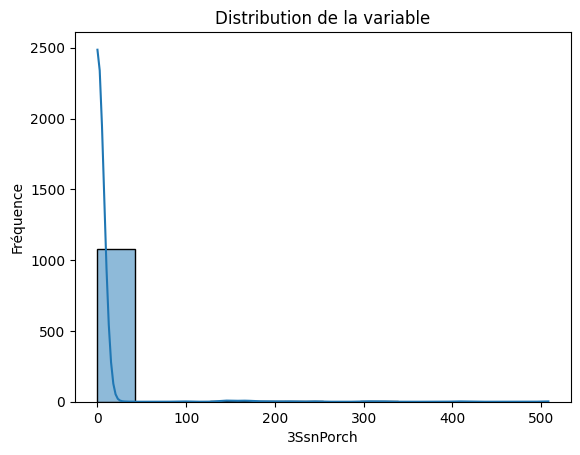

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


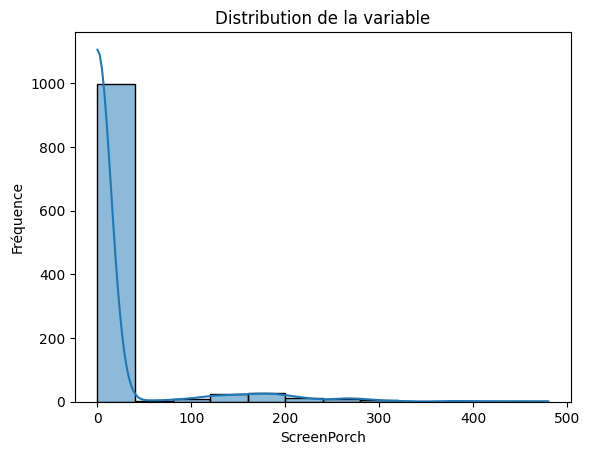

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


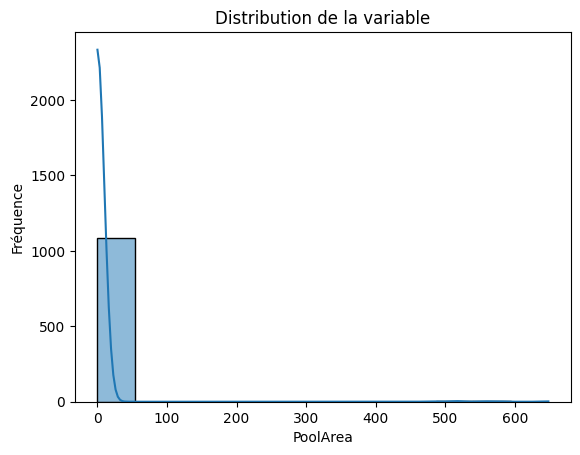

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


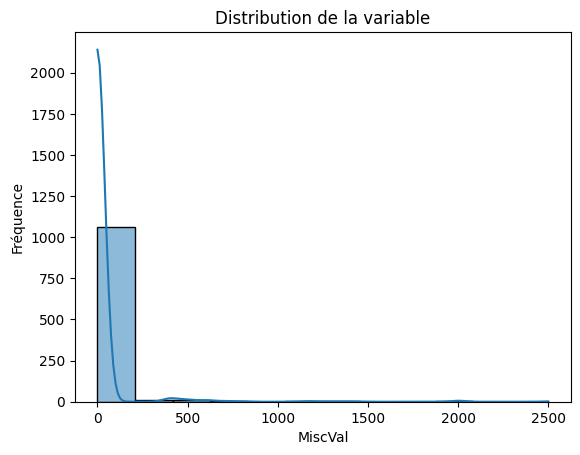

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


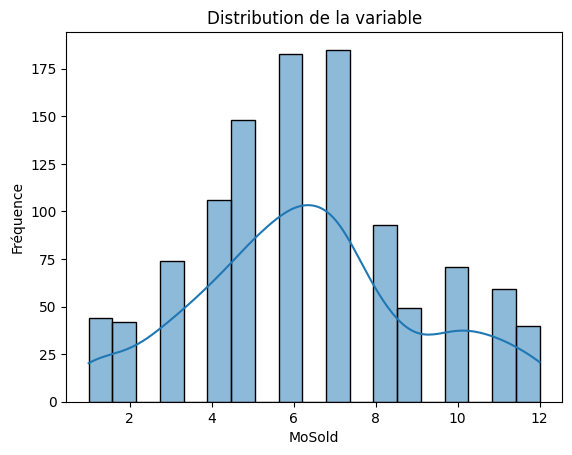

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


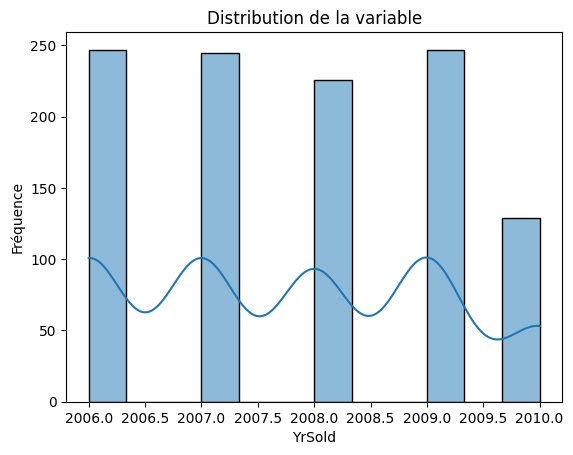

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


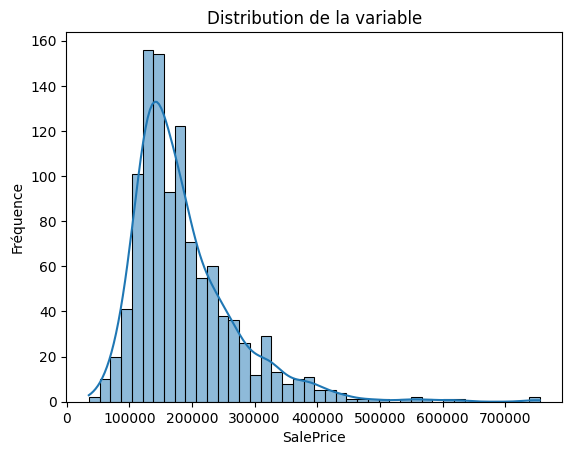

In [16]:
# variables quantitatives
# Histogramme
for i in variables_numeriques:
    sns.histplot(df[i], kde=True)
    plt.title("Distribution de la variable")
    plt.xlabel(i)
    plt.ylabel("Fréquence")
    plt.show()
    

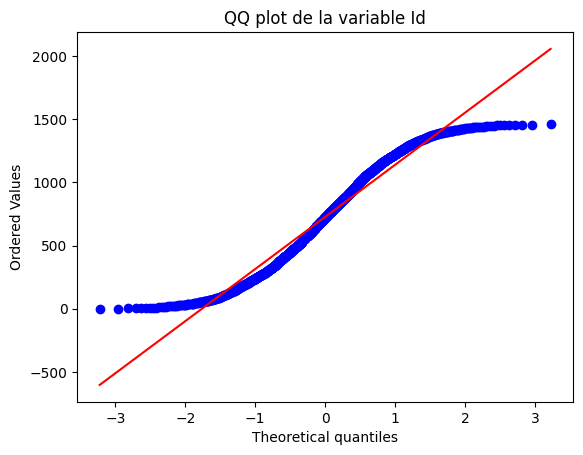

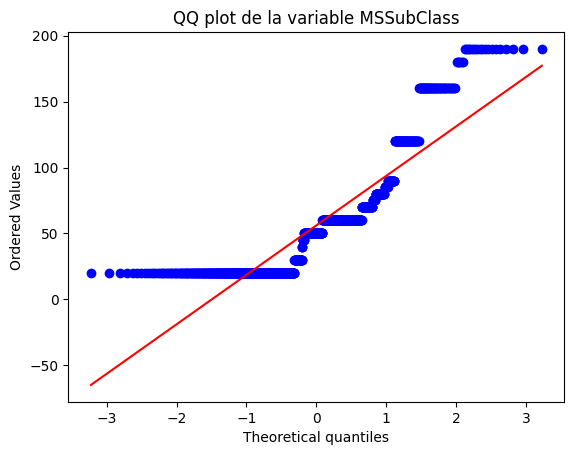

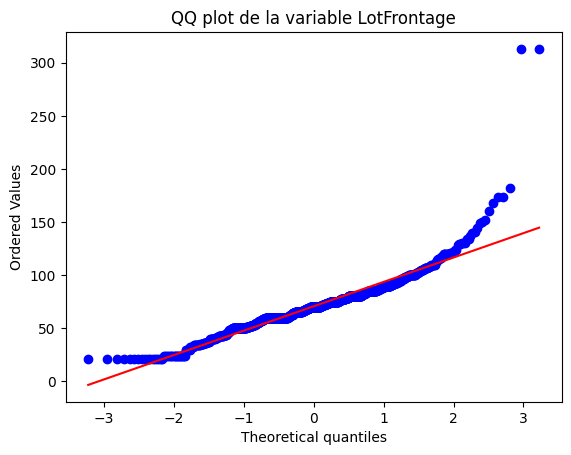

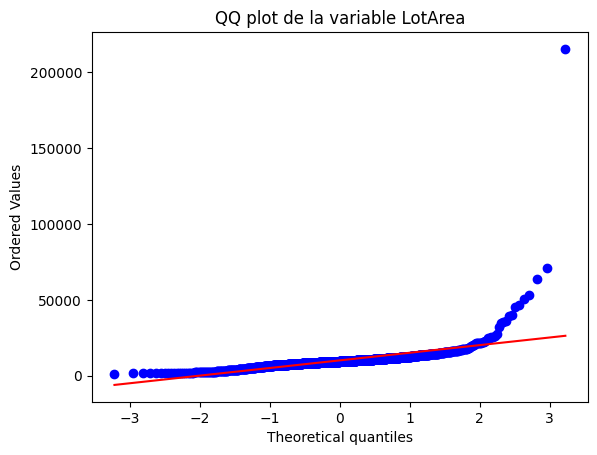

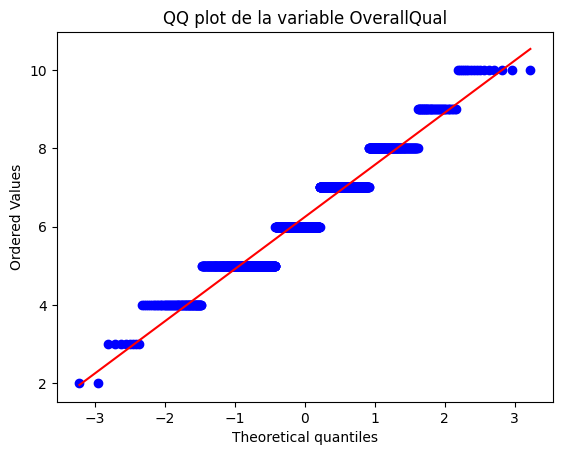

...

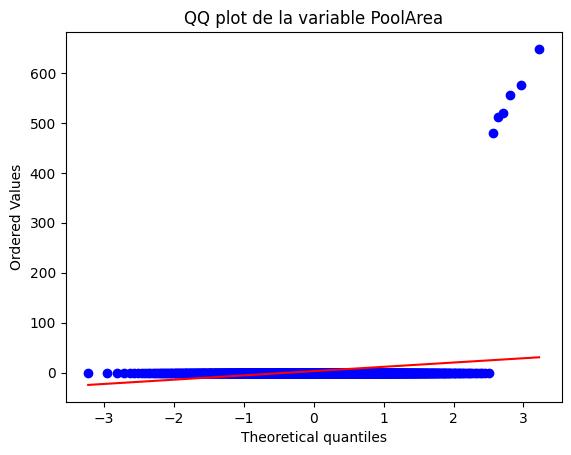

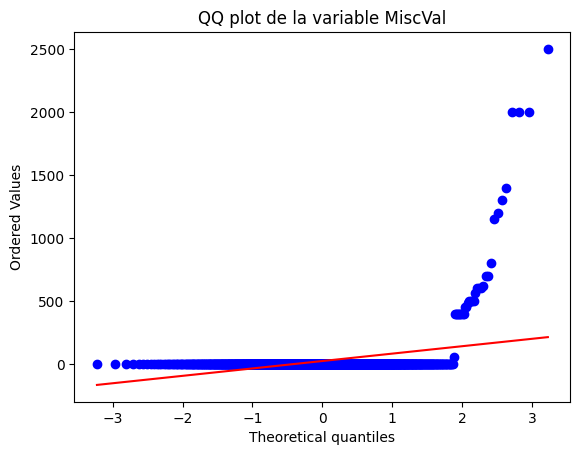

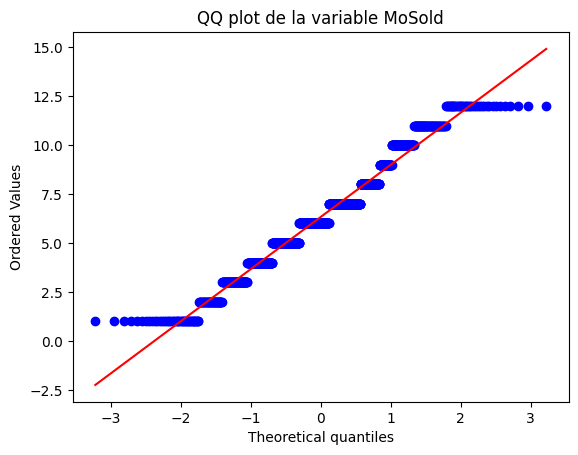

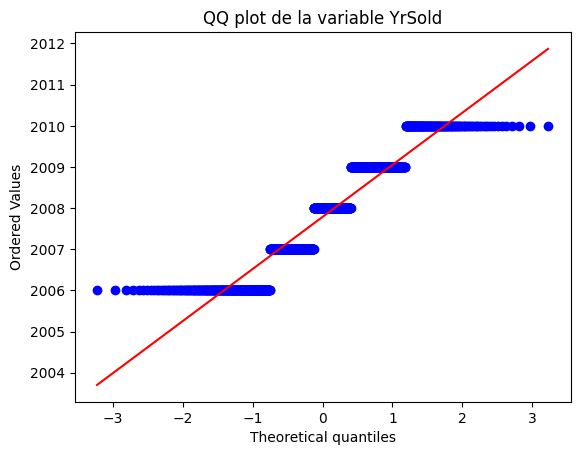

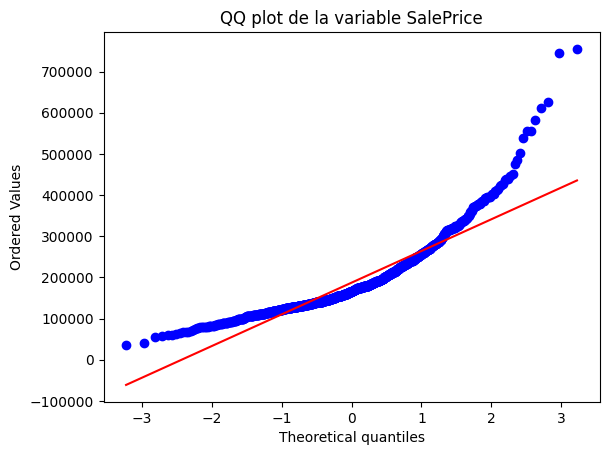

In [17]:
for i in variables_numeriques:
    stats.probplot(df[i],plot=plt)
    plt.title(f"QQ plot de la variable {i}")
    plt.show()

### Observations: 
les variables semblent ne pas etre sur la meme echelle  (standartisation/Normalisation) .
les variables semblent etre anormalement distribuee donc une *Transforamtion* sera necessaire

***********

### test statistique:

### Shapiro-Wilk

#### Hypothèses :
- H0 : la variables est normalement distribuee.
- H1 : la variables n'est pas normalement distribuee.

#### Conditions d'utilisation :
- La variable doit etre quantitative.




#### Interprétation :
- Si p < 0.05, on rejette H0 et on conclut que la variable n'est pas normalement distribuee.
- Si p >= 0.05, on ne peut pas rejeter H0 et on conclut que la variable est normalement distribuee.

In [18]:
from scipy.stats import shapiro, pearsonr, spearmanr, kendalltau
# Vérifier la normalité à l'aide du test de Shapiro-Wilk
for var in variables_numeriques:
    _, p_value = shapiro(df[var])
    print(f"P-valeur de la normalité (Shapiro-Wilk) pour {var}:", p_value)

P-valeur de la normalité (Shapiro-Wilk) pour Id: 1.1614550915686042e-17
P-valeur de la normalité (Shapiro-Wilk) pour MSSubClass: 7.159522160092759e-35
P-valeur de la normalité (Shapiro-Wilk) pour LotFrontage: 1.4901736342005083e-28
P-valeur de la normalité (Shapiro-Wilk) pour LotArea: 1.881300304707333e-51
P-valeur de la normalité (Shapiro-Wilk) pour OverallQual: 4.3386591629743356e-20
P-valeur de la normalité (Shapiro-Wilk) pour OverallCond: 2.558523947998788e-34
P-valeur de la normalité (Shapiro-Wilk) pour YearBuilt: 5.332716263393904e-25
P-valeur de la normalité (Shapiro-Wilk) pour YearRemodAdd: 1.70288805451234e-31
P-valeur de la normalité (Shapiro-Wilk) pour MasVnrArea: 6.460796377571555e-43
P-valeur de la normalité (Shapiro-Wilk) pour BsmtFinSF1: 4.635221747071178e-32
P-valeur de la normalité (Shapiro-Wilk) pour BsmtFinSF2: 6.947237407559197e-53
P-valeur de la normalité (Shapiro-Wilk) pour BsmtUnfSF: 2.8871320799708602e-21
P-valeur de la normalité (Shapiro-Wilk) pour TotalBsmtSF:

### Conclusions: 
aucune variables n'est normalemet distribuee donc nous allons proceder a une normalisation 
******

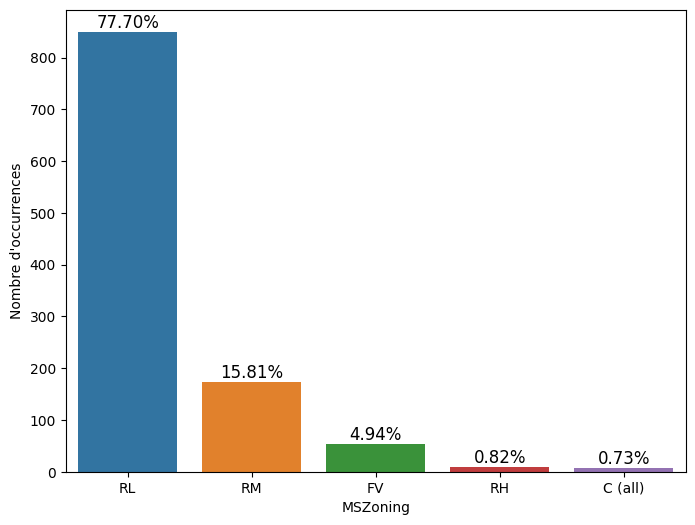

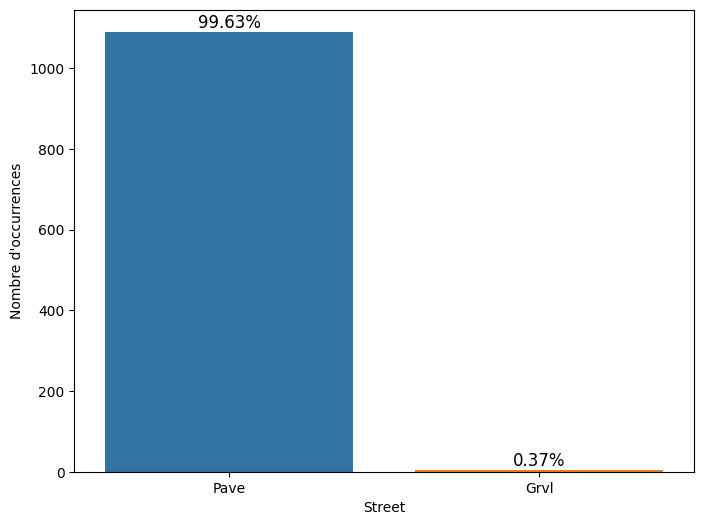

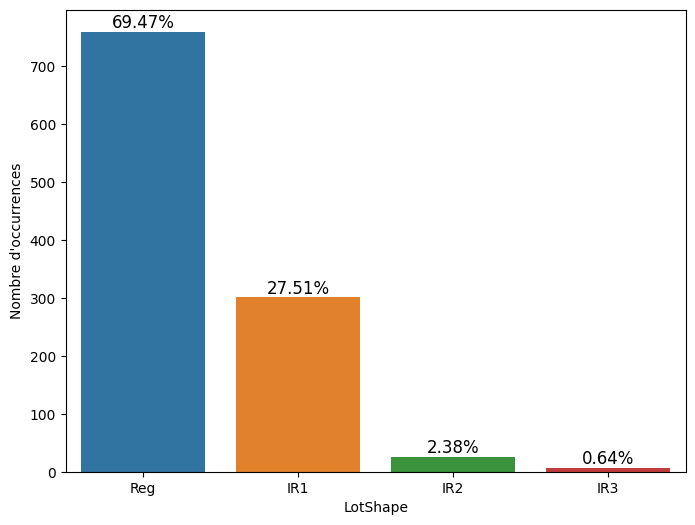

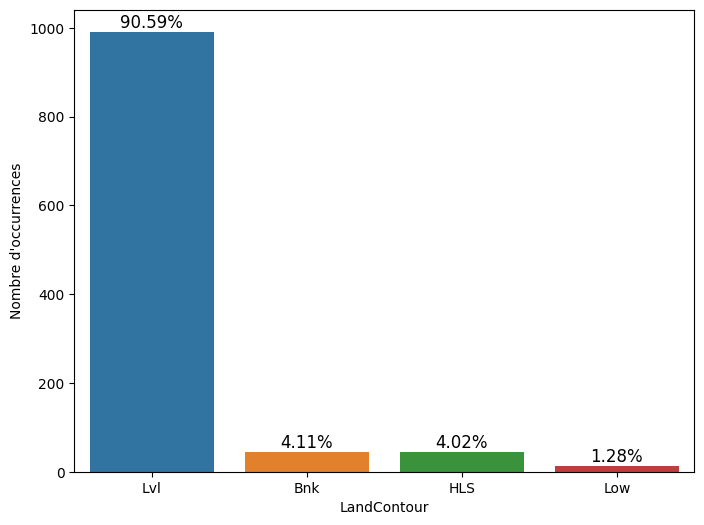

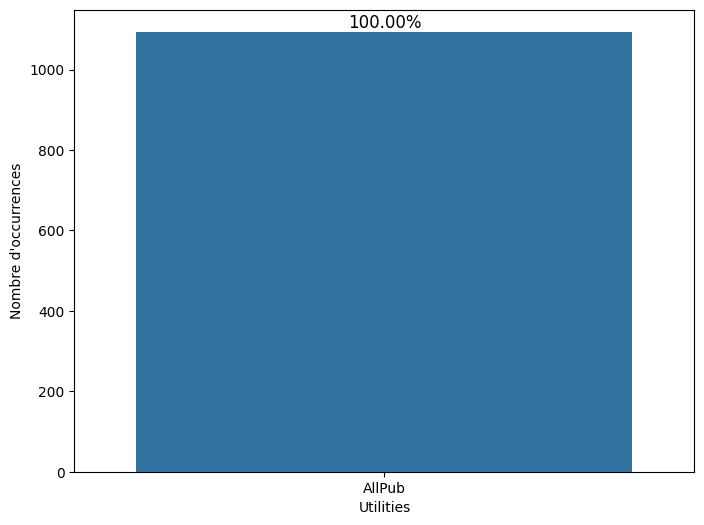

...

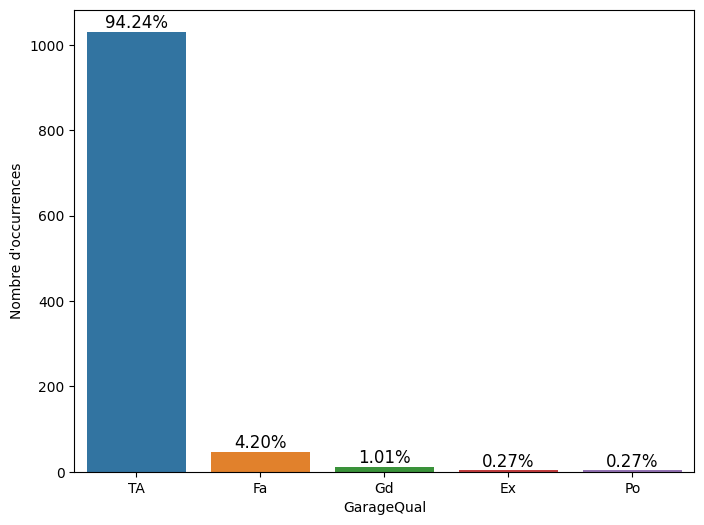

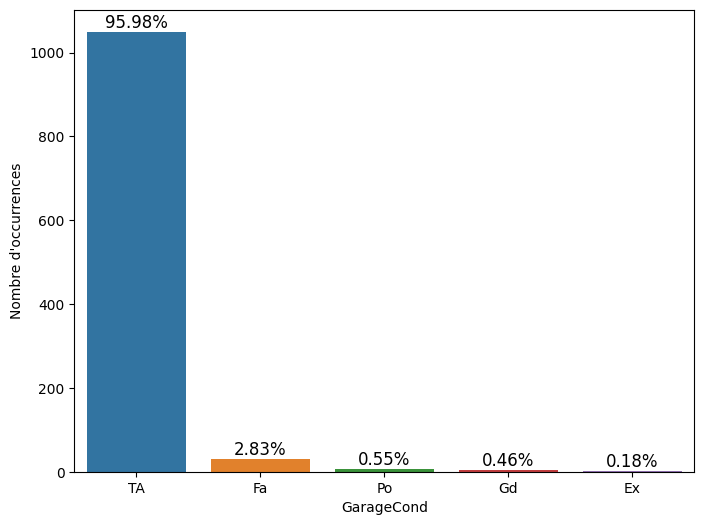

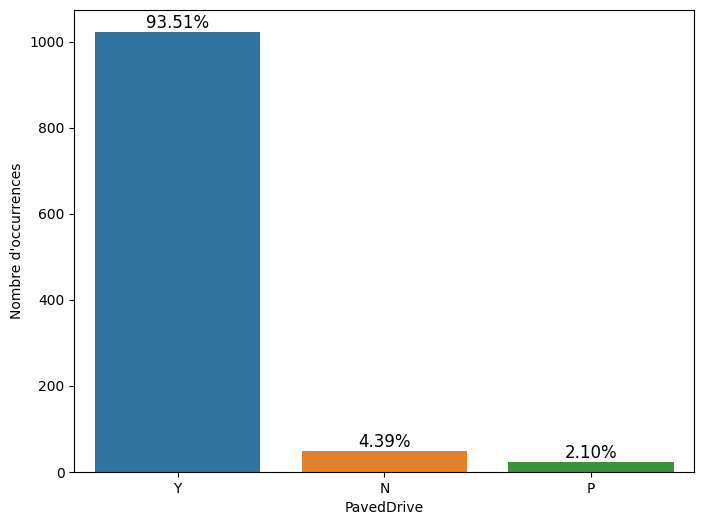

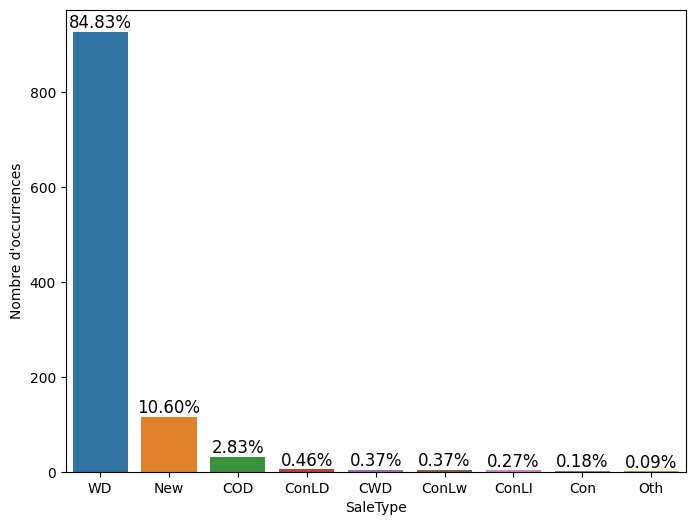

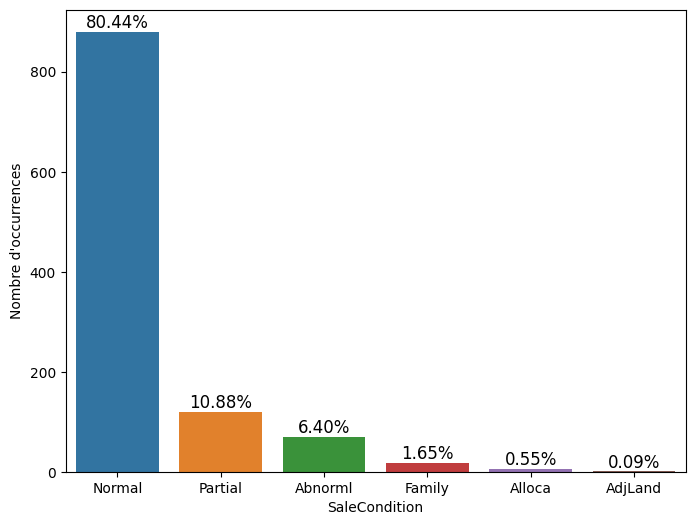

In [19]:
# variables cathegoriels
# Graphique en barres pour la fréquence de chaque catégorie
for i in variables_cathegorielles:
    # Calcul des proportions
    total = len(df)
    proportions = df[i].value_counts(normalize=True) * 100

    # Affichage du countplot
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=i, data=df, order=df[i].value_counts().index)

    # Ajouter les proportions sur les barres
    for p in ax.patches:
        percentage = f'{100 * p.get_height() / total:.2f}%'  # Calcul des pourcentages
        ax.annotate(percentage, (p.get_x() + p.get_width() / 2, p.get_height()), 
                    ha='center', va='bottom', fontsize=12)

    plt.xlabel(i)
    plt.ylabel('Nombre d\'occurrences')
    plt.show()

### Observations:  
    la plus part des variables semblent equilibrees a l'exception de *Street*,*LandContour*,*Utilities*,*LandSlope*,*Condition1*
    *Condition2*, *BldgType*,*RoofMatl*,*ExterCond*,*BsmtCond*,*BsmtFinType2*,*Heating*,*CentralAir*,*Electrical*,*Functional*
    *GarageQual*,*GarageCond*,*PavedDrive*,*SaleType*,*SaleCondition*
    qui peuvent biaiser la modelisation.
    ce sont des variables a supprimer
****

In [20]:
# variables a biais
var_a_biais=['Id','Street','LandContour','Utilities','LandSlope','Condition1',
    'Condition2', 'BldgType','RoofMatl','ExterCond','BsmtCond','BsmtFinType2','Heating','CentralAir','Electrical','Functional',
    'GarageQual','GarageCond','PavedDrive','SaleType','SaleCondition']

### Execution:

In [21]:
# suppression des varaibles a biais
df=df.drop(columns=var_a_biais)

In [22]:
# mise a jour
variables_cathegorielles=df.select_dtypes("object")
variables_numeriques=df.select_dtypes(["float64","int64"])

# 2-Analyses bivariees

## 2-1-Analyse des liaison entre variables quantitatives

### Analyse graphique

In [23]:
# sns.pairplot(df,kind="scatter")

<Axes: >

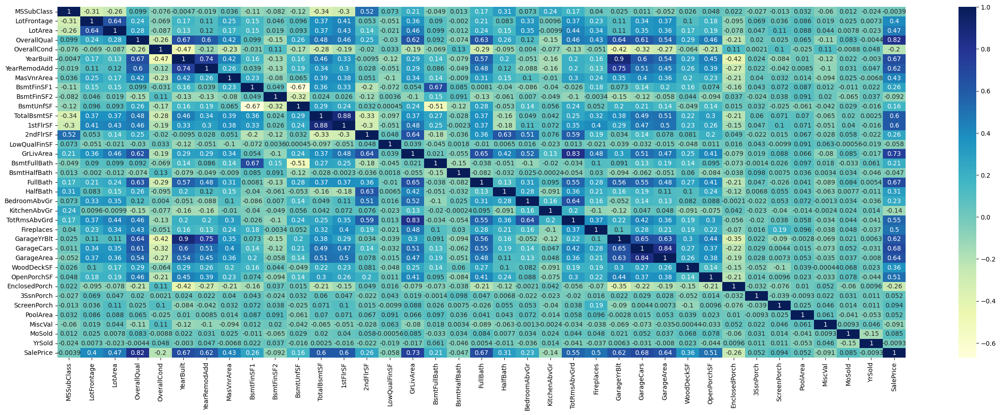

In [24]:
plt.figure(figsize=(30, 10))
num=df.select_dtypes(include=[np.number])
sns.heatmap(num.corr(method='spearman'), cmap='YlGnBu',annot=True)

# pas exploitable

### test statistique:

### Corrélation de Spearman

#### Hypothèses :
- H0 : Il n'y a pas de corrélation **monotone** entre les deux variables.
- H1 : Il y a une corrélation monotone entre les deux variables.

#### Conditions d'utilisation :
- Les deux variables sont quantitatives ou **ordinales**.
- Les données n'ont pas besoin d'être normalement distribuées.
- La relation entre les variables peut être monotone (linéaire ou non linéaire).



#### Interprétation :
Le coefficient de corrélation de Spearman varie entre -1 et 1. 

- Si le coefficient est proche de 1 par exemple (0.6), il y a une corrélation positive entre les variables.
- Si le coefficient est proche de -1 (par exemple -0.6), il y a une corrélation négative entre les variables.
- Si le coefficient est proche de 0, il n'y a pas de  **corrélation monotone (linéaire ou non linéaire)** entre les variables.


Vous pouvez aussi regarder la pvaleur du test:

- Si p < 0.05, on rejette H0 et on conclut qu'il y a une corrélation monotone significative entre les deux variables.
- Si p >= 0.05, on ne peut pas rejeter H0 et on conclut qu'il n'y a pas suffisamment de preuves pour dire qu'il y a une corrélation monotone significative entre les deux variables.

In [25]:
# variables_correlees=[]
# for i in variables_numeriques:
#     for j in variables_numeriques:
#         if(i!=j):
#             # Corrélation de spearman
#             stat,p_value=spearmanr(df[i], df[j])
#             if p_value < 0.05 and (j,i) not in variables_correlees:
#                 variables_correlees.append((i,j))
                    

In [26]:
# print("variables correlees:\n")
# var_cor=pd.DataFrame({"variables correlees":variables_correlees})
# var_cor

In [27]:
# for i in variables_correlees:
#     stat,p_value=spearmanr(df[i[0]], df[i[1]])
#     print(f"intensite de la correlation pour le couple {i}")
#     print(stat)
#     print("\n")

In [28]:
# variables_numeriques = variables_numeriques.drop(columns=['Id'])
# variables_numeriques_clean=variables_numeriques.fillna(variables_numeriques.mean())

In [29]:
corr=variables_numeriques.corr()
corr_pos=[]
for i in variables_numeriques:
    for j in variables_numeriques:
        if (i!=j) and (corr.loc[i,j]>=0.6 or corr.loc[i,j]<=-0.6) and (j,i) not in corr_pos :
            corr_pos.append((i,j))
corr_pos


[('OverallQual', 'GrLivArea'),
 ('OverallQual', 'GarageCars'),
 ('OverallQual', 'SalePrice'),
 ('YearBuilt', 'YearRemodAdd'),
 ('YearBuilt', 'GarageYrBlt'),
 ('YearRemodAdd', 'GarageYrBlt'),
 ('BsmtFinSF1', 'BsmtFullBath'),
 ('TotalBsmtSF', '1stFlrSF'),
 ('TotalBsmtSF', 'SalePrice'),
 ('1stFlrSF', 'SalePrice'),
 ('2ndFlrSF', 'GrLivArea'),
 ('2ndFlrSF', 'HalfBath'),
 ('2ndFlrSF', 'TotRmsAbvGrd'),
 ('GrLivArea', 'FullBath'),
 ('GrLivArea', 'TotRmsAbvGrd'),
 ('GrLivArea', 'SalePrice'),
 ('BedroomAbvGr', 'TotRmsAbvGrd'),
 ('GarageYrBlt', 'GarageCars'),
 ('GarageCars', 'GarageArea'),
 ('GarageCars', 'SalePrice'),
 ('GarageArea', 'SalePrice')]

### Conclusions:

****

## 2-2-Analyse de la liaion entre deux variables qualitatives

### Analyse graphique

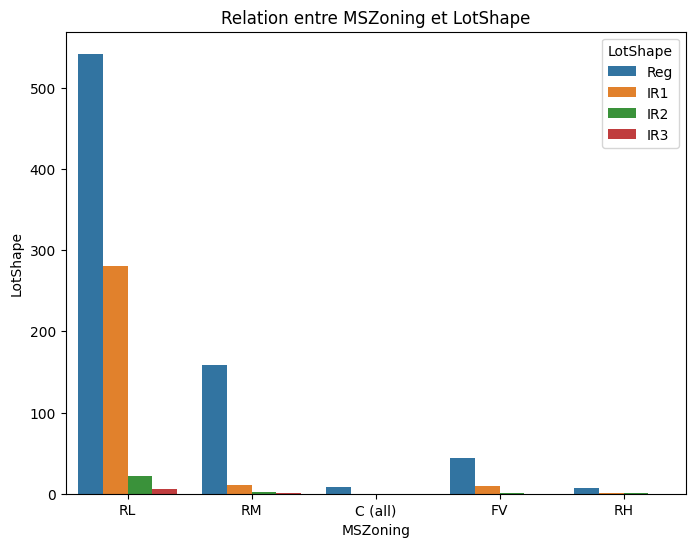

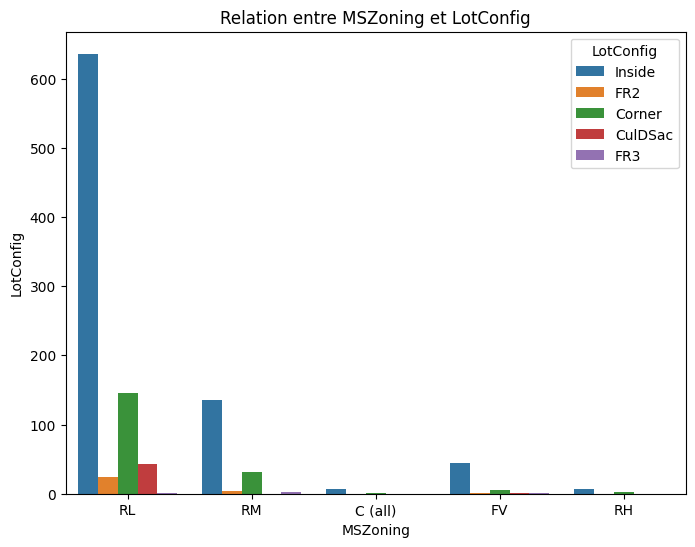

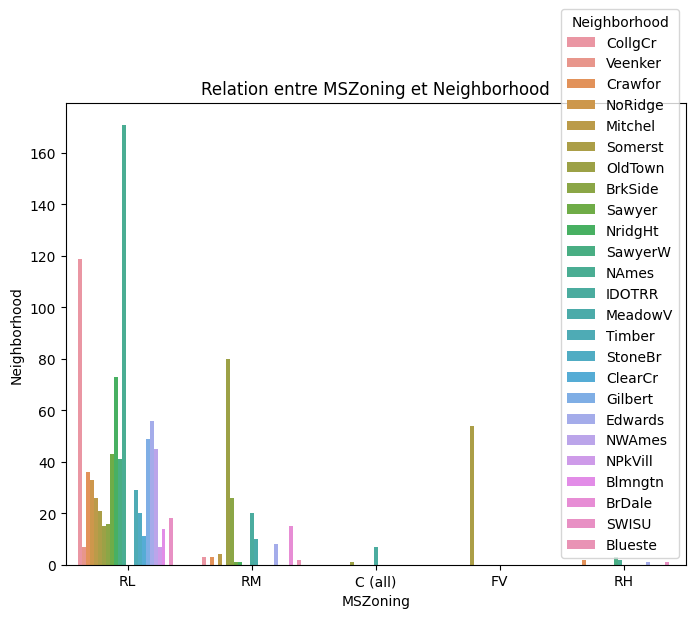

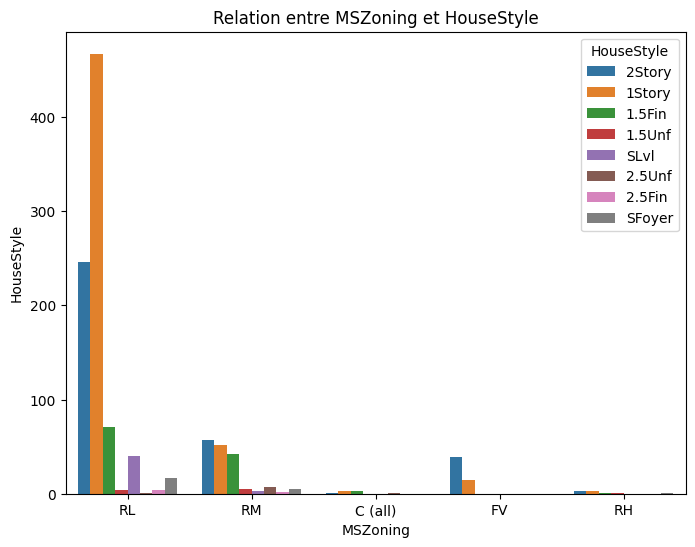

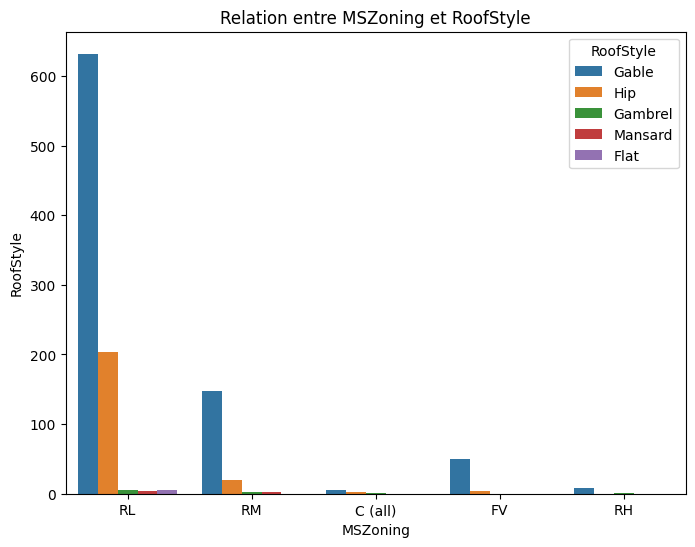

...

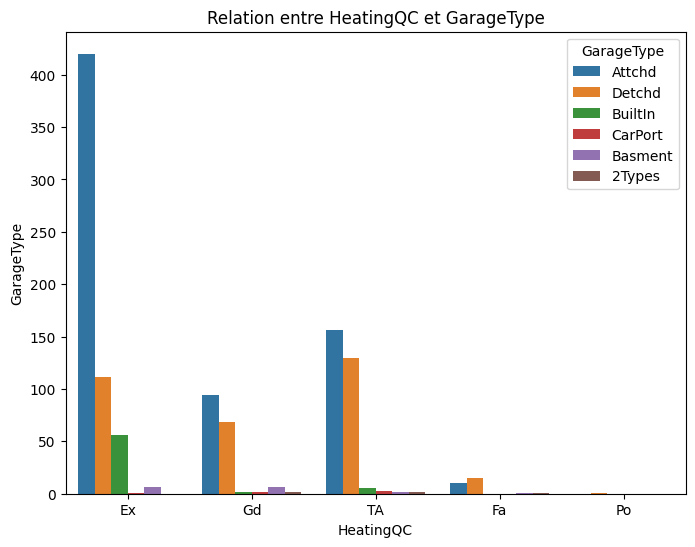

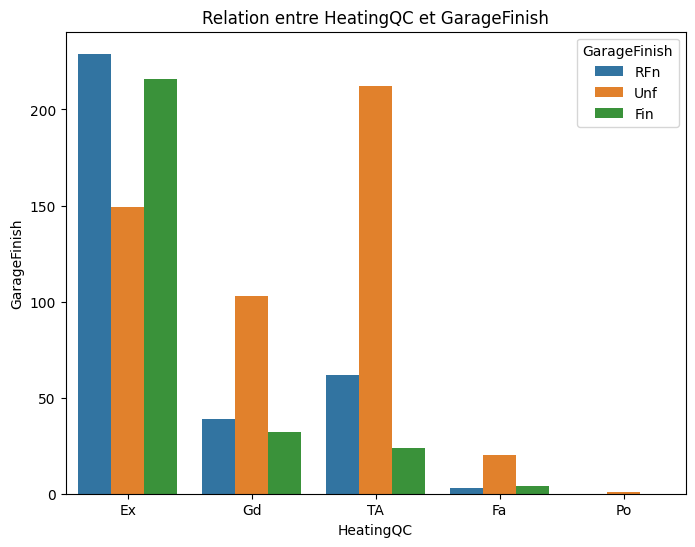

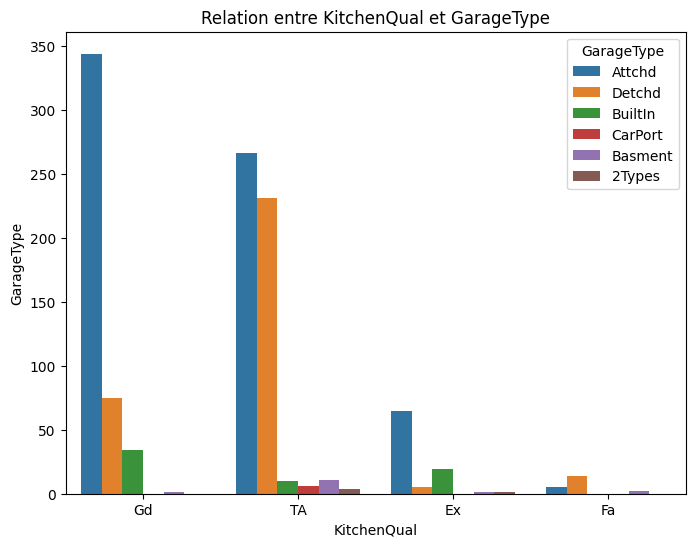

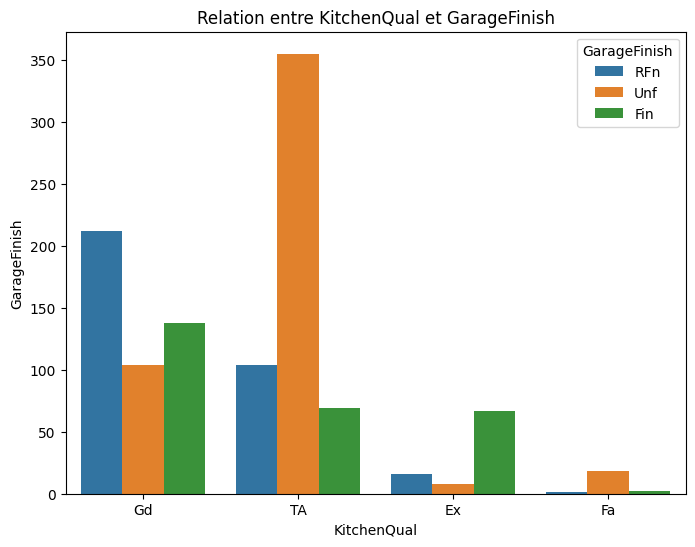

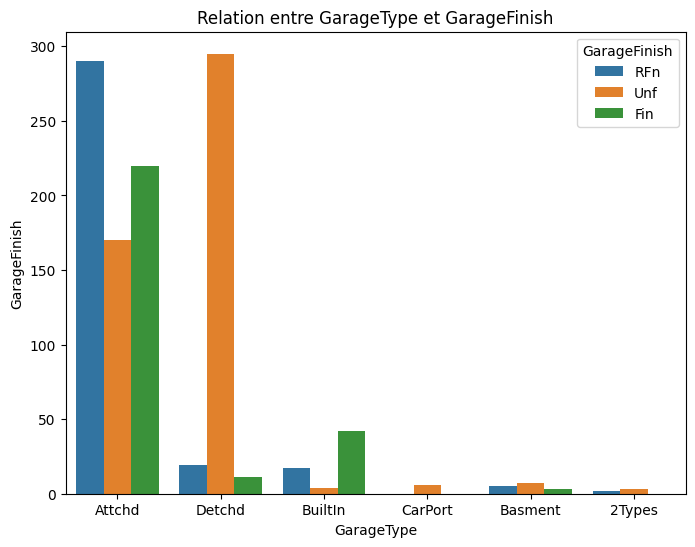

In [30]:
cpt=[]
for i in variables_cathegorielles:
    for j in variables_cathegorielles:
        if(i!=j) and (j,i) not in cpt:
            plt.figure(figsize=(8, 6))
            sns.countplot(data=df, x=i, hue=j)
            plt.xlabel(i)
            plt.ylabel(j)
            plt.title(f'Relation entre {i} et {j}')
            plt.show()
            cpt.append((i,j))

### Test statistique:

### Test du chi-carré (chi2)

#### Hypothèses
- H0 (hypothèse nulle): Il n'y a pas d'association entre les deux variables qualitatives.
- H1 (hypothèse alternative): Il y a une association entre les deux variables qualitatives.

#### Conditions d'utilisation
- Les deux variables sont qualitatives (catégoriques).
- Les effectifs attendus sont supérieurs à 5 pour chaque croissement de variable

#### Interprétation
Si la p-valeur est inférieure au seuil de significativité (généralement 0,05), on rejette l'hypothèse nulle et on conclut qu'il y a une association entre les deux variables qualitatives.

In [31]:
from scipy.stats import chi2_contingency
variables_liees=[]
for i in variables_cathegorielles:
    for j in variables_cathegorielles:
        if(i!=j):
            # Créer un tableau de contingence
            contingency_table = pd.crosstab(df[i], df[j])
            # Vérifier si la table de contingence n'est pas vide
            # Effectuer le test du chi-carré
            chi2_stat, p_value, dof, expected_freq = chi2_contingency(contingency_table)
            if p_value < 0.05 and (j,i) not in variables_liees:
                variables_liees.append((i,j))

In [32]:
# print("variables liees:\n")
# var_cor=pd.DataFrame({"variables liees":variables_liees})
# var_cor

In [33]:
# analyse de l'intensite de la relation
var_liees=[]
for i in variables_liees:
    # Créer un tableau de contingence
    contingency_table = pd.crosstab(df[i[0]], df[i[1]])
    # Effectuer le test du chi-carré
    chi2_stat, p_value, dof, expected_freq = chi2_contingency(contingency_table)
    # Calculer le coefficient T de Tschuprow
    n = df.shape[0]
    min_dim = min(contingency_table.shape) - 1
    # Effectuer le test du chi-carré
    tschuprow_t = np.sqrt(chi2_stat / (n * min_dim))
    if tschuprow_t > 0.5:
        var_liees.append([(i[0],i[1]),tschuprow_t])

In [34]:
var_liees

[[('MSZoning', 'Neighborhood'), 0.6417642094753725],
 [('Neighborhood', 'ExterQual'), 0.5117363555060045],
 [('Neighborhood', 'Foundation'), 0.5055433036192435],
 [('Neighborhood', 'BsmtQual'), 0.5662787599833213],
 [('Neighborhood', 'GarageFinish'), 0.5132897997763134],
 [('Exterior1st', 'Exterior2nd'), 0.7923294504540807],
 [('ExterQual', 'KitchenQual'), 0.5289070673074437]]

### conclusion:
les intensites de ces relations sont tres faibles donc il n'existe aucune relation entre les variables qualitatives

## 2-3-Analyse de la liaison entre une variable qualitative et une variable quantitative

### Analyse graphique

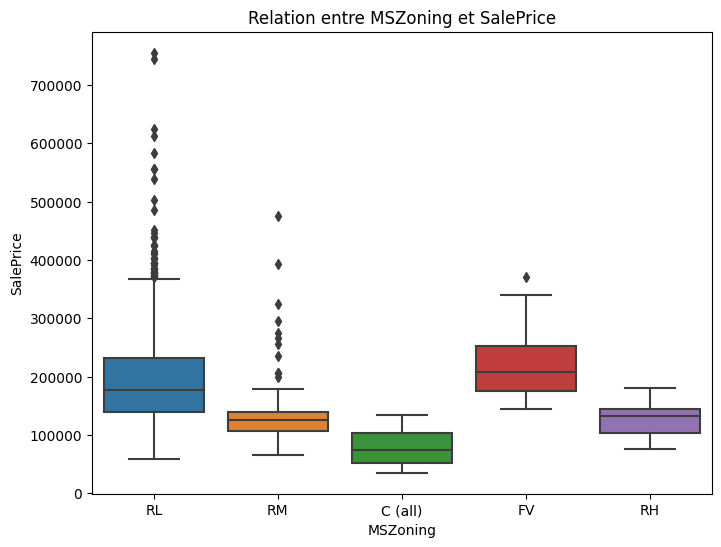

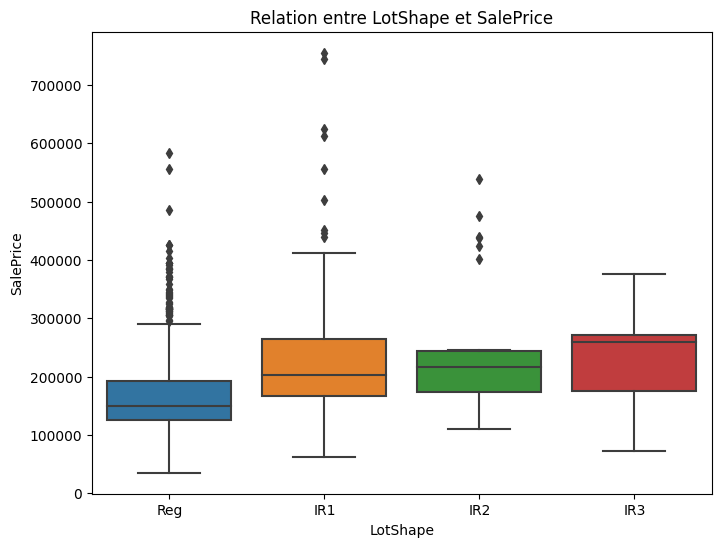

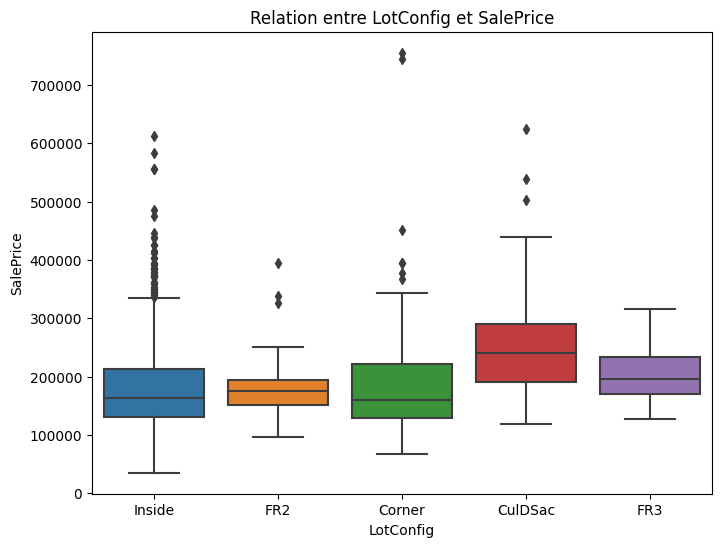

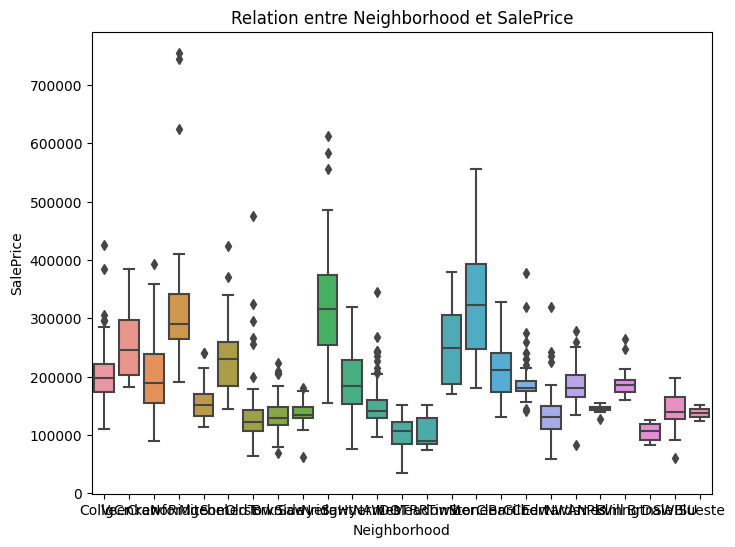

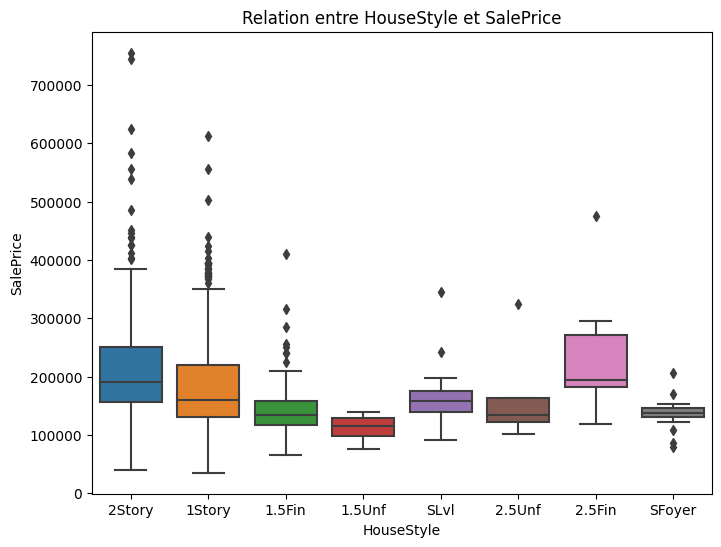

...

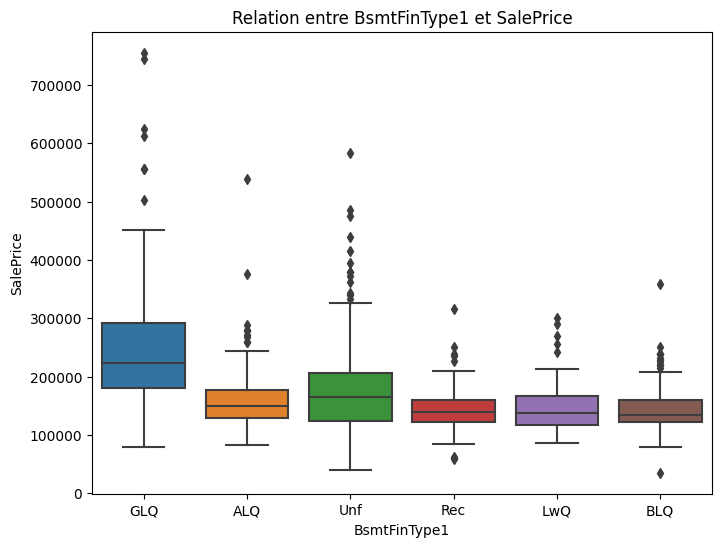

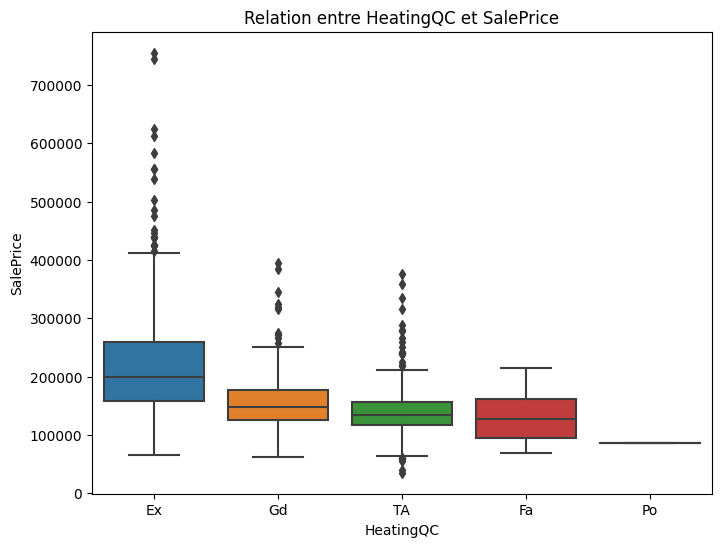

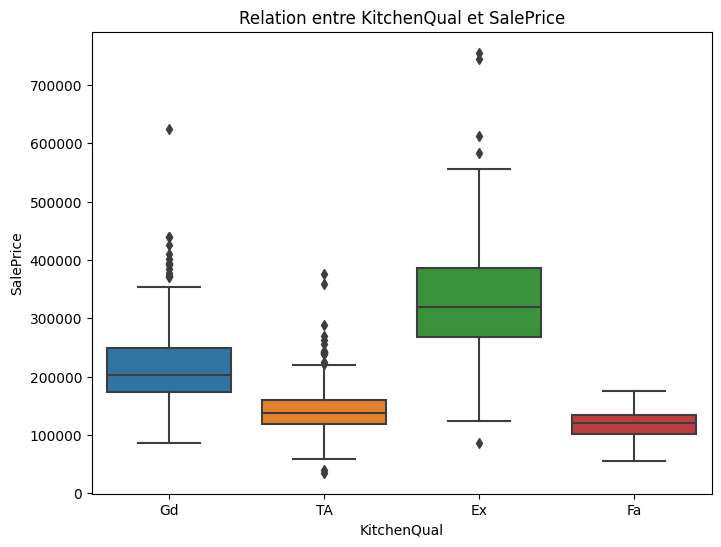

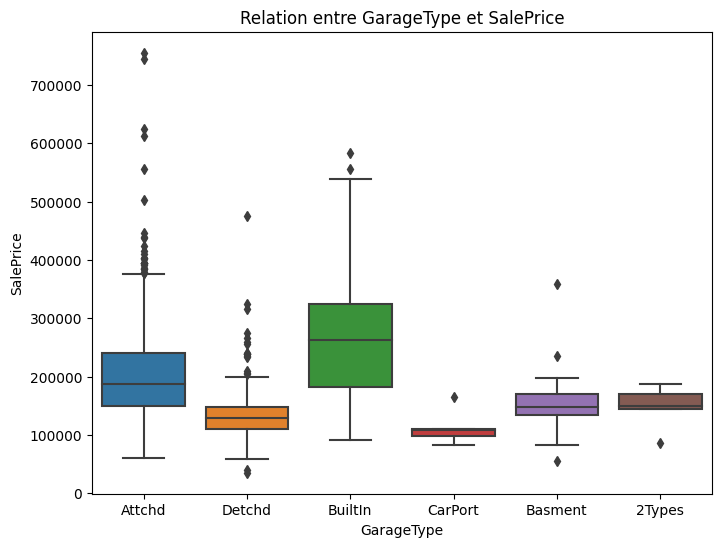

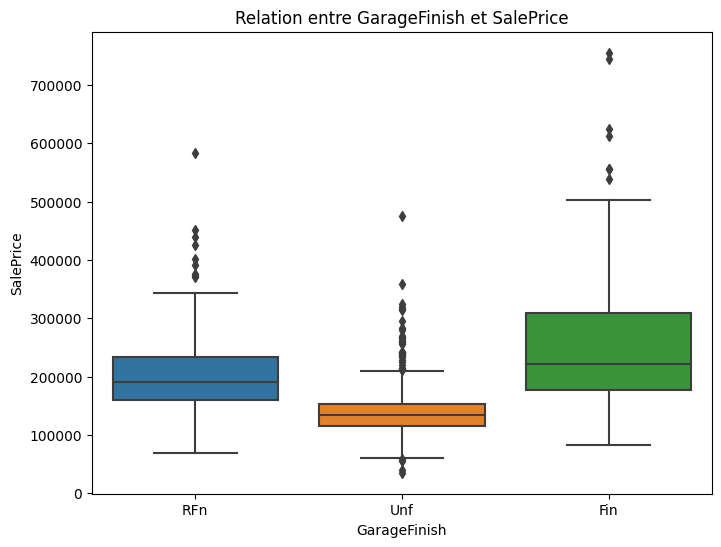

In [35]:
for i in variables_cathegorielles:
    plt.figure(figsize=(8, 6))
    sns.boxplot(data=df, x=i, y="SalePrice")
    plt.xlabel(i)
    plt.ylabel("SalePrice")
    plt.title(f'Relation entre {i} et SalePrice')
    plt.show()

### test statistique : 
### kruskal wallis
#### Hypothèses
- H0 (hypothèse nulle): Les distributions de tous les groupes sont égales.
- H1 (hypothèse alternative): Au moins une des distributions des groupes est différente des autres.

#### Conditions d'utilisation
- Les observations sont indépendantes.
- Les données peuvent être ordonnées (au moins ordinale).
#### Interpretation
Si la p-valeur est inférieure au seuil de significativité (généralement 0,05), on rejette l'hypothèse nulle et on conclut qu'il y a une association entre les deux variables

In [36]:
# test de kruskal wallis pour verifier la relation entre les variables numeriques et les variables cathegorielles du dataset
from scipy.stats import shapiro, ttest_ind, f_oneway, mannwhitneyu, kruskal
var_liees2 = []

# Boucle sur les variables catégorielles et numériques
for i in df.select_dtypes('object').columns:
    cat = df[i].value_counts()
    for j in df.select_dtypes(['int64','float64']).columns:
        # Création des classes en fonction du nombre de catégories
        classes = [df[df[i] == cat.index[k]][j] for k in range(cat.shape[0])]

        # Test de Kruskal-Wallis
        kruskal_stat, kruskal_p_value = kruskal(*classes)

        # Vérification de la p-value
        if kruskal_p_value < 0.05 and (j, i) not in var_liees2:
            var_liees2.append((i, j))

In [37]:
print(" il existe une relation significative entre les variables suivantes:\n")
var_liees2

 il existe une relation significative entre les variables suivantes:



[('MSZoning', 'MSSubClass'),
 ('MSZoning', 'LotFrontage'),
 ('MSZoning', 'LotArea'),
 ('MSZoning', 'OverallQual'),
 ('MSZoning', 'OverallCond'),
 ('MSZoning', 'YearBuilt'),
 ('MSZoning', 'YearRemodAdd'),
 ('MSZoning', 'MasVnrArea'),
 ('MSZoning', 'BsmtFinSF1'),
 ('MSZoning', 'BsmtFinSF2'),
 ('MSZoning', 'TotalBsmtSF'),
 ('MSZoning', '1stFlrSF'),
 ('MSZoning', '2ndFlrSF'),
 ('MSZoning', 'LowQualFinSF'),
 ('MSZoning', 'GrLivArea'),
 ('MSZoning', 'BsmtFullBath'),
 ('MSZoning', 'FullBath'),
 ('MSZoning', 'HalfBath'),
 ('MSZoning', 'BedroomAbvGr'),
 ('MSZoning', 'KitchenAbvGr'),
 ('MSZoning', 'TotRmsAbvGrd'),
 ('MSZoning', 'Fireplaces'),
 ('MSZoning', 'GarageYrBlt'),
 ('MSZoning', 'GarageCars'),
 ('MSZoning', 'GarageArea'),
 ('MSZoning', 'WoodDeckSF'),
 ('MSZoning', 'OpenPorchSF'),
 ('MSZoning', 'EnclosedPorch'),
 ('MSZoning', 'MiscVal'),
 ('MSZoning', 'SalePrice'),
 ('LotShape', 'LotFrontage'),
 ('LotShape', 'LotArea'),
 ('LotShape', 'OverallQual'),
 ('LotShape', 'OverallCond'),
 ('LotShap

# 4-Analyse des valeurs extremes et aberrantes

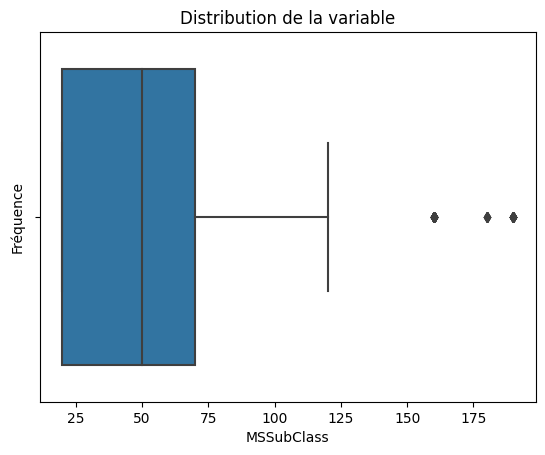

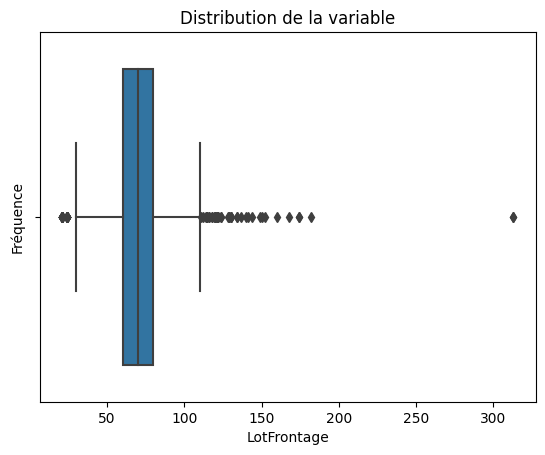

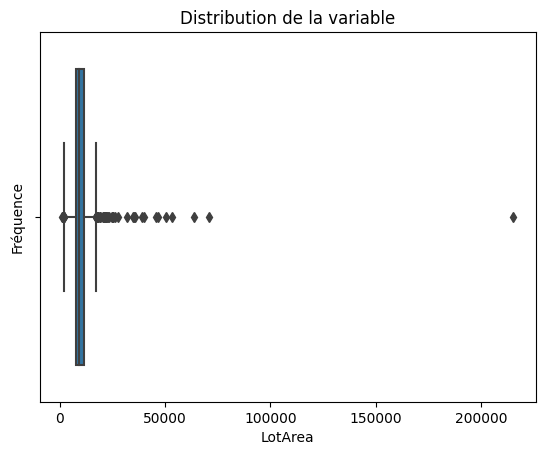

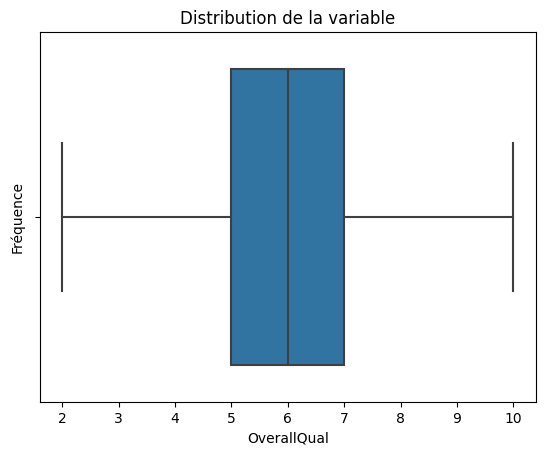

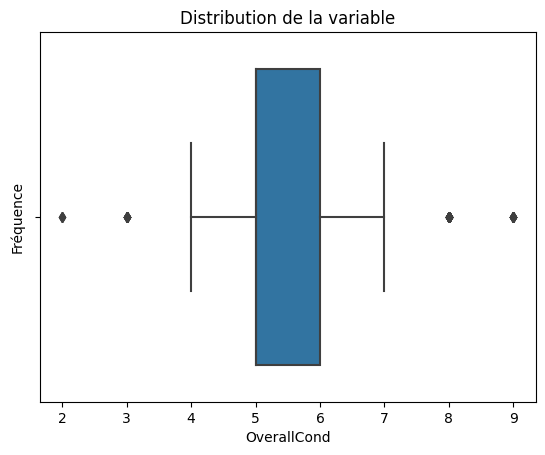

...

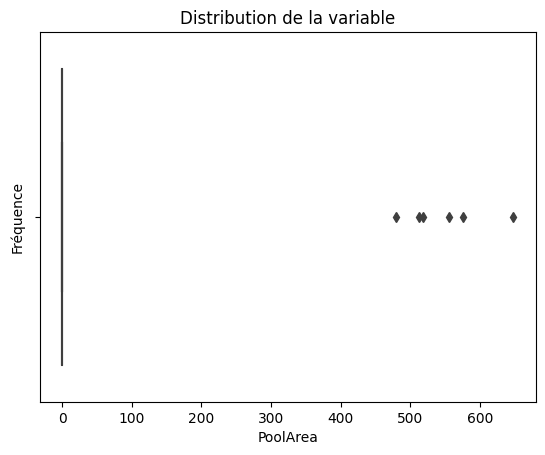

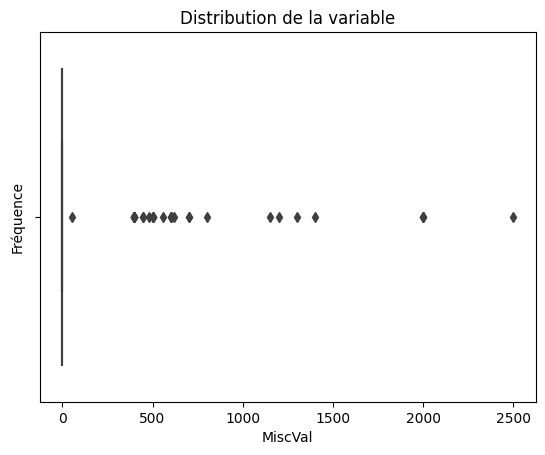

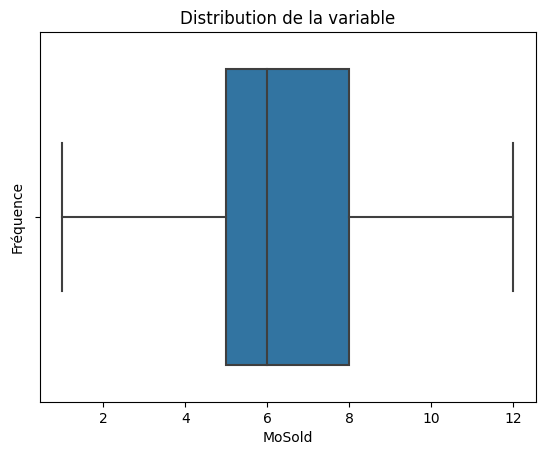

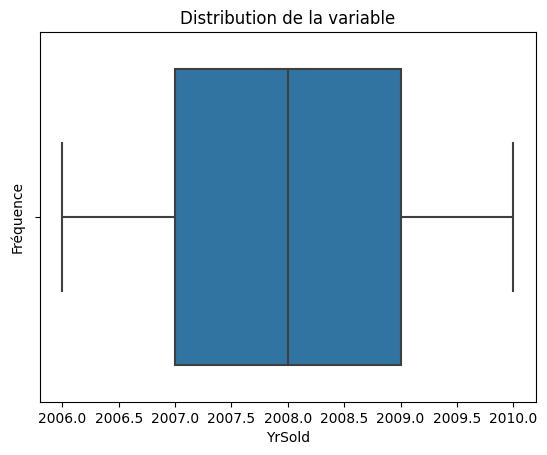

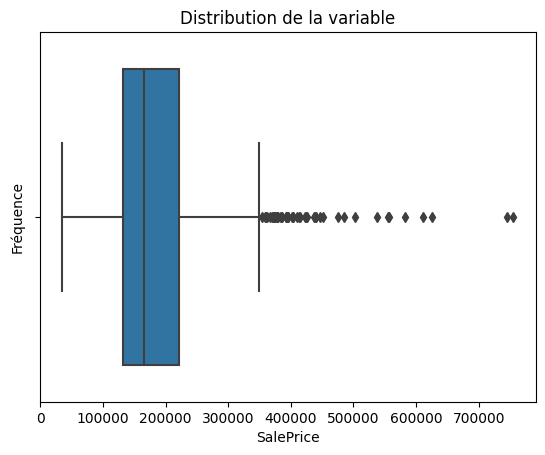

In [38]:
# Analyses graphiques pour les valeurs extremes
# variables quantitatives
# Histogramme
for i in variables_numeriques:
    sns.boxplot(x=df[i])
    plt.title("Distribution de la variable")
    plt.xlabel(i)
    plt.ylabel("Fréquence")
    plt.show()

### Observations:
beaucoup de valeurs extremes mais aucune valeurs aberrantes

# II-Prétraitement des Données

In [39]:
# df=df.drop(columns=NAn_columns)

In [40]:
# df=df.dropna(axis=0)

In [41]:
# df.info()

## Normalisation/Standirsation des variables numeriques

In [42]:
# from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler
# scaler = RobustScaler()
# df_num_scale=pd.DataFrame()
# for i in variables_numeriques:
#     df_num_scale[i]=scaler.fit_transform(variables_numeriques[i])

In [43]:
# df_num_scale

In [44]:
# # Histogramme
# for i in df_num_scale.select_dtypes(["int64","float64"]):
#     sns.histplot(df_num_scale[i], kde=True)
#     plt.title("Distribution de la variable")
#     plt.xlabel(i)
#     plt.ylabel("Fréquence")
#     plt.show()

## Transformation des variables qualitatives: Encodage

In [45]:
from sklearn.model_selection import train_test_split
X=df.drop('SalePrice',axis=1)
y=df['SalePrice']

# # OneHot Encoding sur le reste de variables
# X_clean=pd.get_dummies(df,dtype='int64')

x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=1)

In [46]:
# x_train

In [47]:
y_train

600     275000
507     208300
596     114504
3       140000
471     190000
         ...  
1128    215000
945     124900
1203    213000
313     375000
1415    175900
Name: SalePrice, Length: 875, dtype: int64

# III-Selection de variables

### par la variance

In [48]:
# from sklearn.feature_selection import VarianceThreshold
# # Appliquer le seuil de variance
# threshold = 0.2  # Exemple de seuil, à adapter selon les besoins
# selector = VarianceThreshold(threshold=threshold)
# X_high_variance = selector.fit_transform(x_train)

# # Afficher les caractéristiques sélectionnées
# selected_columns = x_train.columns[selector.get_support()]
# print(f"Caractéristiques sélectionnées : {selected_columns}")

In [49]:
# var_delete=[]
# for i in x_train:
#     if i not in selected_columns:
#         var_delete.append(i)
# var_delete

### par la relation

In [50]:
corr_num=[]
for i in corr_pos:
    if i[1]=="SalePrice":
        corr_num.append(i[0])

In [51]:
print("variables numeriques selectionnees\n")
corr_num

variables numeriques selectionnees



['OverallQual',
 'TotalBsmtSF',
 '1stFlrSF',
 'GrLivArea',
 'GarageCars',
 'GarageArea']

In [52]:
var_liees2

[('MSZoning', 'MSSubClass'),
 ('MSZoning', 'LotFrontage'),
 ('MSZoning', 'LotArea'),
 ('MSZoning', 'OverallQual'),
 ('MSZoning', 'OverallCond'),
 ('MSZoning', 'YearBuilt'),
 ('MSZoning', 'YearRemodAdd'),
 ('MSZoning', 'MasVnrArea'),
 ('MSZoning', 'BsmtFinSF1'),
 ('MSZoning', 'BsmtFinSF2'),
 ('MSZoning', 'TotalBsmtSF'),
 ('MSZoning', '1stFlrSF'),
 ('MSZoning', '2ndFlrSF'),
 ('MSZoning', 'LowQualFinSF'),
 ('MSZoning', 'GrLivArea'),
 ('MSZoning', 'BsmtFullBath'),
 ('MSZoning', 'FullBath'),
 ('MSZoning', 'HalfBath'),
 ('MSZoning', 'BedroomAbvGr'),
 ('MSZoning', 'KitchenAbvGr'),
 ('MSZoning', 'TotRmsAbvGrd'),
 ('MSZoning', 'Fireplaces'),
 ('MSZoning', 'GarageYrBlt'),
 ('MSZoning', 'GarageCars'),
 ('MSZoning', 'GarageArea'),
 ('MSZoning', 'WoodDeckSF'),
 ('MSZoning', 'OpenPorchSF'),
 ('MSZoning', 'EnclosedPorch'),
 ('MSZoning', 'MiscVal'),
 ('MSZoning', 'SalePrice'),
 ('LotShape', 'LotFrontage'),
 ('LotShape', 'LotArea'),
 ('LotShape', 'OverallQual'),
 ('LotShape', 'OverallCond'),
 ('LotShap

In [53]:
corr_cat=[]
for i in var_liees2:
    if i[1]=="SalePrice":
        corr_cat.append(i[0])

In [54]:
print("variables qualitatives selectionnees\n")
corr_cat

variables qualitatives selectionnees



['MSZoning',
 'LotShape',
 'LotConfig',
 'Neighborhood',
 'HouseStyle',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'ExterQual',
 'Foundation',
 'BsmtQual',
 'BsmtExposure',
 'BsmtFinType1',
 'HeatingQC',
 'KitchenQual',
 'GarageType',
 'GarageFinish']

In [55]:
variables_finales=corr_num + corr_cat

In [56]:
variables_finales

['OverallQual',
 'TotalBsmtSF',
 '1stFlrSF',
 'GrLivArea',
 'GarageCars',
 'GarageArea',
 'MSZoning',
 'LotShape',
 'LotConfig',
 'Neighborhood',
 'HouseStyle',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'ExterQual',
 'Foundation',
 'BsmtQual',
 'BsmtExposure',
 'BsmtFinType1',
 'HeatingQC',
 'KitchenQual',
 'GarageType',
 'GarageFinish']

In [57]:
df_final=df[variables_finales]

In [58]:
df_final

,OverallQual,TotalBsmtSF,1stFlrSF,GrLivArea,GarageCars,GarageArea,MSZoning,LotShape,LotConfig,Neighborhood,...,Exterior2nd,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish
0,7,856,856,1710,2,548,RL,Reg,Inside,CollgCr,...,VinylSd,Gd,PConc,Gd,No,GLQ,Ex,Gd,Attchd,RFn
1,6,1262,1262,1262,2,460,RL,Reg,FR2,Veenker,...,MetalSd,TA,CBlock,Gd,Gd,ALQ,Ex,TA,Attchd,RFn
2,7,920,920,1786,2,608,RL,IR1,Inside,CollgCr,...,VinylSd,Gd,PConc,Gd,Mn,GLQ,Ex,Gd,Attchd,RFn
3,7,756,961,1717,3,642,RL,IR1,Corner,Crawfor,...,Wd Shng,TA,BrkTil,TA,No,ALQ,Gd,Gd,Detchd,Unf
4,8,1145,1145,2198,3,836,RL,IR1,FR2,NoRidge,...,VinylSd,Gd,PConc,Gd,Av,GLQ,Ex,Gd,Attchd,RFn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,6,953,953,1647,2,460,RL,Reg,Inside,Gilbert,...,VinylSd,TA,PConc,Gd,No,Unf,Ex,TA,Attchd,RFn
1456,6,1542,2073,2073,2,500,RL,Reg,Inside,NWAmes,...,Plywood,TA,CBlock,Gd,No,ALQ,TA,TA,Attchd,Unf
1457,7,1152,1188,2340,1,252,RL,Reg,Inside,Crawfor,...,CmentBd,Ex,Stone,TA,No,GLQ,Ex,Gd,Attchd,RFn
1458,5,1078,1078,1078,1,240,RL,Reg,Inside,NAmes,...,MetalSd,TA,CBlock,TA,Mn,GLQ,Gd,Gd,Attchd,Unf


In [59]:
from sklearn.model_selection import train_test_split
X=df.drop('SalePrice',axis=1)
y=df['SalePrice']

# # OneHot Encoding sur le reste de variables
X_clean=pd.get_dummies(df,dtype='int64')

x_train_new,x_test_new,y_train_new,y_test_new=train_test_split(X_clean,y,test_size=0.2,random_state=1)

In [60]:
x_train_new

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,KitchenQual_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf
600,60,74.0,10927,8,5,2005,2005,280.0,546,0,...,0,0,0,0,1,0,0,1,0,0
507,20,75.0,7862,6,5,2009,2009,0.0,27,0,...,0,0,1,0,0,0,0,1,0,0
596,70,60.0,3600,6,7,1910,1993,0.0,0,0,...,1,0,0,0,0,0,1,0,0,1
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,...,0,0,0,0,0,0,1,0,0,1
471,60,92.0,11952,7,6,1977,1977,0.0,0,0,...,1,0,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1128,60,59.0,11796,7,5,2004,2005,0.0,0,0,...,0,0,0,0,1,0,0,1,0,0
945,50,98.0,8820,5,6,1890,1996,0.0,1088,0,...,1,0,0,0,0,0,1,0,0,1
1203,20,75.0,9750,7,5,2000,2001,171.0,0,0,...,0,0,1,0,0,0,0,0,0,1
313,20,150.0,215245,7,5,1965,1965,0.0,1236,820,...,1,0,1,0,0,0,0,0,1,0


In [61]:
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,StackingRegressor,GradientBoostingRegressor
from sklearn.linear_model import LinearRegression

model=RandomForestRegressor(n_estimators=300,random_state=42)
model2=LinearRegression()

In [62]:
model.fit(x_train_new,y_train_new)
model2.fit(x_train_new,y_train_new)

LinearRegression()

In [63]:
pred_test=model.predict(x_test_new)
pred_train=model.predict(x_train_new)
pred_test1=model2.predict(x_test_new)
pred_train1=model2.predict(x_train_new)

In [64]:
from sklearn.metrics import r2_score, mean_squared_error,mean_absolute_error,explained_variance_score
# verification over/under fitting
# obtention des metrics
r2_train1=r2_score(y_train_new,pred_train)
r2_test1=r2_score(y_test_new,pred_test)
mse_train1=mean_squared_error(y_train_new,pred_train)
mse_test1=mean_squared_error(y_test_new,pred_test)
rmse_train1=np.sqrt(mse_train1)
rmse_test1=np.sqrt(mse_test1)

r2_train2=r2_score(y_train_new,pred_train1)
r2_test2=r2_score(y_test_new,pred_test1)
mse_train2=mean_squared_error(y_train_new,pred_train1)
mse_test2=mean_squared_error(y_test_new,pred_test1)
rmse_train2=np.sqrt(mse_train2)
rmse_test2=np.sqrt(mse_test2)

In [65]:
Metrics=pd.DataFrame({
    "model":["RandomForestRegressor","LinearRegression"],
    'Train_R2':[r2_train1,r2_train2],
    'Test_R2':[r2_test1,r2_test2],
    'Train_MSE':[mse_train1,mse_train2],
    'Test_MSE':[mse_test1,mse_test2],
    'Train_RMSE':[rmse_train1,rmse_train2],
    'Test_RMSE':[rmse_test1,rmse_test2]
})
Metrics

,model,Train_R2,Test_R2,Train_MSE,Test_MSE,Train_RMSE,Test_RMSE
0,RandomForestRegressor,0.9992,0.999171,5.480380e+06,5.895756e+06,2.341021e+03,2.428118e+03
1,LinearRegression,1.0000,1.000000,6.582172e-21,6.670143e-21,8.113059e-11,8.167094e-11
